# Cell Instance Segmentation with UNI Pathology Foundation Model

This notebook implements cell instance segmentation on the BCCD dataset by adapting the UNI foundation model (ViT-L/16) with a HoVer-Net-inspired multi-task decoder.

**Architecture**: UNI backbone → DPT-style Feature Pyramid → 3 decoder heads (NP, HV, NC)

**Sections**:
0. Setup & Configuration
1. Data Download & Exploration
2. Data Processing (Instance Maps, HV Maps)
3. Dataset & DataLoaders
4. Model Architecture
5. Loss Functions
6. Training Phase 1 (Decoder Only)
7. Training Phase 2 (LoRA Fine-tuning)
8. Post-Processing (Watershed)
9. Evaluation
10. Visualization & Analysis

## 0. Setup & Configuration

In [1]:
# ============================================================
# Configurable Parameters
# ============================================================
MODE = "eval"              # "train" or "eval". "eval" is for optional slurm workflow by passing this parameter via papermill. This will skip the training phases entirely.
PHASE = 2                   # 1 = decoder only, 2 = LoRA fine-tuning
EPOCHS = 30
BATCH_SIZE = 16
LR = 1e-3
RESUME_TRAINING = True       # Auto-resume from latest checkpoint if interrupted

DATA_DIR = "BCCD Dataset with mask"  # Path to extracted Kaggle dataset
PROCESSED_DIR = "data/processed"     # Where to save processed .npy files
CHECKPOINT_PATH = None      # Path to resume from or evaluate
SAVE_DIR = "checkpoints"
RESULTS_DIR = "results"
NUM_WORKERS = 0             # 0 for Jupyter; SLURM overrides via -p NUM_WORKERS 8
SEED = 42
NUM_CLASSES = 4             # bg, RBC, WBC, Platelet
INPUT_SIZE = 224
RESIZE_SIZE = 256           # Resize to this before cropping to INPUT_SIZE
USE_COMPILE = False         # torch.compile() for speedup (set True for SLURM batch)
USE_DDP = False             # DistributedDataParallel (auto-enabled by SLURM env vars)
GRAD_ACCUM_TARGET = 16      # Effective batch size target for gradient accumulation

In [2]:
import os
import sys
import time
import glob
import json
import random
import warnings
from pathlib import Path
from collections import defaultdict, Counter

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap
import cv2
from PIL import Image
from tqdm.auto import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms.functional as TF

import timm
from scipy.ndimage import center_of_mass, label as scipy_label, binary_fill_holes
from skimage.morphology import remove_small_objects
from skimage.segmentation import watershed
from skimage.measure import label as skimage_label, regionprops
from sklearn.model_selection import train_test_split
import albumentations as A

warnings.filterwarnings('ignore')

print(f"Python: {sys.version}")
print(f"PyTorch: {torch.__version__}")
print(f"timm: {timm.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"VRAM: {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")

Python: 3.10.13 | packaged by conda-forge | (main, Oct 26 2023, 18:07:37) [GCC 12.3.0]
PyTorch: 2.1.2
timm: 1.0.24
CUDA available: True
GPU: NVIDIA L40S
VRAM: 47.7 GB


In [3]:
# Reproducibility
def seed_everything(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

seed_everything(SEED)

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {DEVICE}")

# Create directories
for d in [SAVE_DIR, RESULTS_DIR, 'logs']:
    os.makedirs(d, exist_ok=True)
for split in ['train', 'val', 'test']:
    for sub in ['images', 'instance_maps', 'class_maps']:
        os.makedirs(f'{PROCESSED_DIR}/{split}/{sub}', exist_ok=True)

# Class definitions
CLASS_NAMES = {0: 'Background', 1: 'RBC', 2: 'WBC', 3: 'Platelet'}
CLASS_COLORS = {
    0: (0, 0, 0),        # Background: black
    1: (220, 50, 50),    # RBC: red
    2: (50, 50, 220),    # WBC: blue
    3: (50, 200, 50),    # Platelet: green
}
# Inverse frequency weights for CE loss (RBC is most common)
# First set of class weights missclassified every WBC and platelet as RBCs. Second class puts larger weights on WBCs and platelets
# CLASS_WEIGHTS = torch.tensor([0.1, 0.3, 3.0, 5.0], dtype=torch.float32)
CLASS_WEIGHTS = torch.tensor([0.05, 0.5, 5.0, 8.0], dtype=torch.float32)

Device: cuda


In [4]:
# ============================================================
# Distributed Training Setup (DDP) — Optional
# ============================================================
import torch.distributed as dist
from torch.nn.parallel import DistributedDataParallel as DDP_Module
from torch.utils.data.distributed import DistributedSampler

def setup_ddp():
    """Initialize DDP from SLURM or torchrun environment variables."""
    if 'SLURM_PROCID' in os.environ:
        rank = int(os.environ['SLURM_PROCID'])
        local_rank = int(os.environ.get('LOCAL_RANK', os.environ.get('SLURM_LOCALID', 0)))
        world_size = int(os.environ.get('WORLD_SIZE', os.environ.get('SLURM_NTASKS', 1)))
    elif 'RANK' in os.environ:
        rank = int(os.environ['RANK'])
        local_rank = int(os.environ['LOCAL_RANK'])
        world_size = int(os.environ['WORLD_SIZE'])
    else:
        return False, 0, 0, 1

    torch.cuda.set_device(local_rank)
    dist.init_process_group(
        backend='nccl',
        init_method='env://',
        world_size=world_size,
        rank=rank,
    )
    return True, rank, local_rank, world_size

def is_main_process():
    """Return True if rank 0 or not in DDP mode."""
    if not dist.is_initialized():
        return True
    return dist.get_rank() == 0

def cleanup_ddp():
    """Clean up DDP resources."""
    if dist.is_initialized():
        dist.destroy_process_group()

# Auto-detect DDP from environment
DDP_ACTIVE = False
RANK = 0
LOCAL_RANK = 0
WORLD_SIZE = 1

if USE_DDP or 'SLURM_PROCID' in os.environ or 'RANK' in os.environ:
    DDP_ACTIVE, RANK, LOCAL_RANK, WORLD_SIZE = setup_ddp()
    if DDP_ACTIVE:
        DEVICE = torch.device(f'cuda:{LOCAL_RANK}')
        if is_main_process():
            print(f"DDP initialized: rank={RANK}, local_rank={LOCAL_RANK}, "
                  f"world_size={WORLD_SIZE}, device={DEVICE}")
    else:
        print("DDP requested but not available. Running single-GPU.")
else:
    print("Single-GPU mode (no DDP).")

ValueError: Error initializing torch.distributed using env:// rendezvous: environment variable MASTER_ADDR expected, but not set

## 1. Data Download & Exploration

**Dataset**: BCCD Dataset with Mask from Kaggle  
**Download**: https://www.kaggle.com/datasets/jeetblahiri/bccd-dataset-with-mask/data  

Please download the dataset manually and extract it into `data/raw/`.

In [5]:
# Verify data exists and discover structure
def discover_dataset(data_dir):
    """Walk the data directory and catalogue all images and masks."""
    raw_path = Path(data_dir)
    if not raw_path.exists():
        raise FileNotFoundError(
            f"{data_dir} not found. Please download the BCCD dataset from "
            "https://www.kaggle.com/datasets/jeetblahiri/bccd-dataset-with-mask/data "
            f"and extract it into {data_dir}/"
        )

    # Find all image files recursively
    img_exts = {'.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff'}
    all_files = []
    for ext in img_exts:
        all_files.extend(raw_path.rglob(f'*{ext}'))
        all_files.extend(raw_path.rglob(f'*{ext.upper()}'))
    all_files = sorted(set(all_files))

    # Separate images and masks by path heuristics
    # This dataset uses: {train,test}/{original,mask}/*.png
    images = []
    masks = []
    for f in all_files:
        parts = str(f).lower()
        if '/mask/' in parts or '/masks/' in parts or 'mask' in f.parent.name.lower():
            masks.append(f)
        else:
            images.append(f)

    # Identify train/test split from folder names
    splits = {'train': {'images': [], 'masks': []},
              'test': {'images': [], 'masks': []}}
    for img in images:
        parts = str(img).lower()
        if '/test/' in parts:
            splits['test']['images'].append(img)
        else:
            splits['train']['images'].append(img)
    for msk in masks:
        parts = str(msk).lower()
        if '/test/' in parts:
            splits['test']['masks'].append(msk)
        else:
            splits['train']['masks'].append(msk)

    # Sort to ensure consistent pairing
    for split in splits:
        splits[split]['images'].sort()
        splits[split]['masks'].sort()

    print(f"Total files found: {len(all_files)}")
    print(f"Images: {len(images)}, Masks: {len(masks)}")
    for split_name, split_data in splits.items():
        print(f"  {split_name}: {len(split_data['images'])} images, "
              f"{len(split_data['masks'])} masks")

    # Inspect a sample mask
    if masks:
        sample_mask = np.array(Image.open(masks[0]))
        print(f"\nSample mask info:")
        print(f"  Path: {masks[0].name}")
        print(f"  Shape: {sample_mask.shape}")
        print(f"  Dtype: {sample_mask.dtype}")
        if sample_mask.ndim == 2:
            print(f"  Unique values ({len(np.unique(sample_mask))}): "
                  f"{np.unique(sample_mask)[:20]}")
        else:
            unique_colors = set()
            for r in range(0, sample_mask.shape[0], 5):
                for c in range(0, sample_mask.shape[1], 5):
                    unique_colors.add(tuple(sample_mask[r, c, :3]))
            print(f"  Unique colors ({len(unique_colors)}): "
                  f"{list(unique_colors)[:15]}...")

        sample_img = np.array(Image.open(images[0]))
        print(f"\nSample image info:")
        print(f"  Shape: {sample_img.shape}")
        print(f"  Dtype: {sample_img.dtype}")

    return splits

splits = discover_dataset(DATA_DIR)

Total files found: 2656
Images: 1328, Masks: 1328
  train: 1169 images, 1169 masks
  test: 159 images, 159 masks

Sample mask info:
  Path: e02301ac-68f7-4daf-b2ba-254b917f1cca.png
  Shape: (1383, 1944, 3)
  Dtype: uint8
  Unique colors (2): [(0, 0, 0), (255, 255, 255)]...

Sample image info:
  Shape: (1383, 1944, 3)
  Dtype: uint8


In [6]:
# Pair images with masks by filename stem matching
def pair_images_masks(image_list, mask_list):
    """Match images to masks by filename stem."""
    mask_dict = {}
    for m in mask_list:
        stem = Path(m).stem.lower()
        # Strip common mask suffixes
        for suffix in ['_mask', 'mask_', '_seg', '_label', '_gt', '_anno']:
            stem = stem.replace(suffix, '')
        mask_dict[stem] = m

    pairs = []
    unmatched_images = []
    for img in image_list:
        stem = Path(img).stem.lower()
        if stem in mask_dict:
            pairs.append((img, mask_dict[stem]))
        else:
            unmatched_images.append(img)

    print(f"Paired: {len(pairs)}, Unmatched images: {len(unmatched_images)}")
    if unmatched_images and len(unmatched_images) <= 10:
        print(f"  Unmatched: {[Path(u).name for u in unmatched_images]}")
    elif unmatched_images:
        print(f"  First 5 unmatched: {[Path(u).name for u in unmatched_images[:5]]}")
    return pairs

train_pairs = pair_images_masks(splits['train']['images'], splits['train']['masks'])
test_pairs = pair_images_masks(splits['test']['images'], splits['test']['masks'])
print(f"\nTrain pairs: {len(train_pairs)}, Test pairs: {len(test_pairs)}")
if train_pairs:
    print(f"  Sample pair: {Path(train_pairs[0][0]).name} <-> {Path(train_pairs[0][1]).name}")

Paired: 1169, Unmatched images: 0
Paired: 159, Unmatched images: 0

Train pairs: 1169, Test pairs: 159
  Sample pair: 002f20ad-2ace-499c-9335-c9080bc3e6b5.png <-> 002f20ad-2ace-499c-9335-c9080bc3e6b5.png


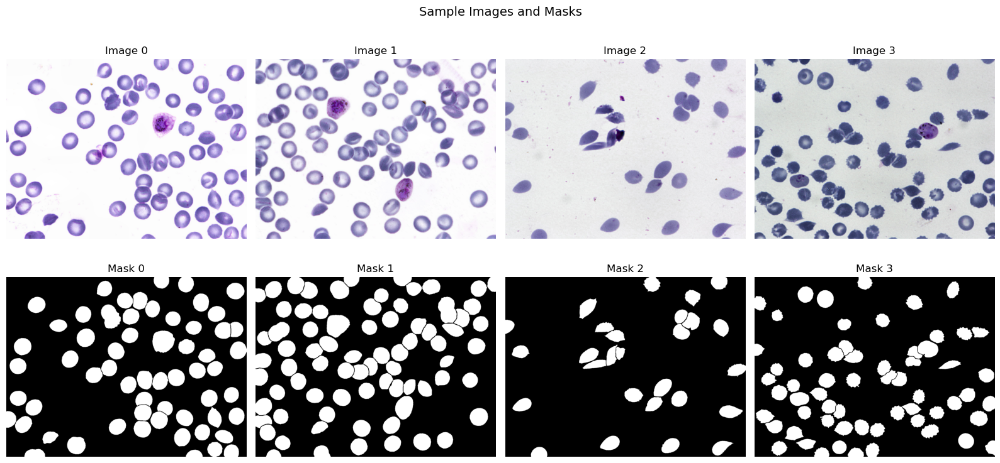

In [7]:
# Visualize a few samples to understand the mask format
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
for i in range(min(4, len(train_pairs))):
    img = np.array(Image.open(train_pairs[i][0]))
    msk = np.array(Image.open(train_pairs[i][1]))

    axes[0, i].imshow(img)
    axes[0, i].set_title(f'Image {i}')
    axes[0, i].axis('off')

    if msk.ndim == 3:
        axes[1, i].imshow(msk)
    else:
        axes[1, i].imshow(msk, cmap='nipy_spectral')
    axes[1, i].set_title(f'Mask {i}')
    axes[1, i].axis('off')

plt.suptitle('Sample Images and Masks', fontsize=14)
plt.tight_layout()
plt.savefig(f'{RESULTS_DIR}/sample_data.png', dpi=150, bbox_inches='tight')
plt.show()

## 2. Data Processing

Convert raw masks into:
- **Instance maps**: each connected component gets a unique ID
- **Class maps**: per-pixel class label (0=bg, 1=RBC, 2=WBC, 3=Platelet)
- **HV maps**: per-pixel horizontal/vertical normalized distance to instance centroid

In [8]:
def detect_mask_format(mask_sample):
    """
    Detect whether the mask is:
    - 'rgb_color': RGB image with different colors per class
    - 'grayscale_instance': single-channel with unique IDs per instance
    - 'binary': single-channel binary (foreground/background only)
    """
    if mask_sample.ndim == 3 and mask_sample.shape[2] >= 3:
        return 'rgb_color'
    unique_vals = np.unique(mask_sample)
    if len(unique_vals) == 2:
        return 'binary'
    if len(unique_vals) <= 10:
        return 'grayscale_class'  # Few values = class IDs
    return 'grayscale_instance'   # Many values = instance IDs


def build_color_to_class_map(mask_paths, num_samples=20):
    """
    For RGB masks: sample unique colors and cluster them into classes.
    Returns a dict mapping (R, G, B) -> class_id.
    """
    all_colors = Counter()
    for p in mask_paths[:num_samples]:
        msk = np.array(Image.open(p))
        if msk.ndim == 2:
            continue
        # Subsample pixels for speed
        h, w = msk.shape[:2]
        pixels = msk.reshape(-1, msk.shape[2])
        for px in pixels[::50]:
            all_colors[tuple(px[:3])] += 1

    # Sort by frequency (background is most common)
    sorted_colors = all_colors.most_common()
    print(f"Top 15 mask colors (frequency): {sorted_colors[:15]}")

    # Heuristic assignment — will need adjustment based on actual data
    # The user should verify this mapping after seeing the output
    color_map = {}
    # Background is the most frequent color
    if sorted_colors:
        color_map[sorted_colors[0][0]] = 0  # Background

    # Remaining colors assigned by dominance in RGB channels
    remaining = [c for c, _ in sorted_colors[1:] if _ > 100]
    for color in remaining:
        r, g, b = color[:3]
        if r > g and r > b:
            color_map[color] = 1  # RBC (red)
        elif b > r and b > g:
            color_map[color] = 2  # WBC (blue)
        elif g > r and g > b:
            color_map[color] = 3  # Platelet (green)
        else:
            # Ambiguous - assign based on brightness
            brightness = r + g + b
            if brightness < 100:
                color_map[color] = 0  # Dark = background
            else:
                color_map[color] = 1  # Default to RBC

    print(f"Color -> Class mapping: {color_map}")
    return color_map


# Detect format
sample_mask = np.array(Image.open(train_pairs[0][1]))
mask_format = detect_mask_format(sample_mask)
print(f"Detected mask format: {mask_format}")

color_to_class = None
if mask_format == 'rgb_color':
    all_mask_paths = [p[1] for p in train_pairs + test_pairs]
    color_to_class = build_color_to_class_map(all_mask_paths)

Detected mask format: rgb_color
Top 15 mask colors (frequency): [((0, 0, 0), 594738), ((255, 255, 255), 204006)]
Color -> Class mapping: {(0, 0, 0): 0, (255, 255, 255): 1}


In [9]:
def parse_mask_to_instances(mask, color_to_class=None):
    """
    Convert a raw mask into instance_map and class_map.

    Returns:
        instance_map: (H, W) uint16, 0=background, >0=instance ID
        class_map: (H, W) uint8, per-pixel class label
    """
    h, w = mask.shape[:2]
    class_map = np.zeros((h, w), dtype=np.uint8)
    instance_map = np.zeros((h, w), dtype=np.uint16)
    instance_id = 1

    if mask.ndim == 3 and color_to_class is not None:
        # RGB mask with color-to-class mapping
        for color, cls_id in color_to_class.items():
            if cls_id == 0:
                continue
            color_arr = np.array(color[:3], dtype=np.uint8)
            # Allow tolerance for JPEG compression artifacts
            diff = np.abs(mask[:, :, :3].astype(int) - color_arr.astype(int))
            match = np.all(diff < 30, axis=2)
            if not match.any():
                continue
            class_map[match] = cls_id
            # Connected components for this class
            labeled, n = skimage_label(match, return_num=True)
            for j in range(1, n + 1):
                component = (labeled == j)
                if component.sum() < 5:  # Skip tiny noise
                    continue
                instance_map[component] = instance_id
                instance_id += 1

    elif mask.ndim == 3:
        # RGB mask without explicit color map — treat non-black as foreground
        # and separate by color similarity
        gray = cv2.cvtColor(mask[:, :, :3], cv2.COLOR_RGB2GRAY)
        fg = gray > 20
        class_map[fg] = 1  # Default to RBC
        labeled, n = skimage_label(fg, return_num=True)
        for j in range(1, n + 1):
            component = (labeled == j)
            if component.sum() < 5:
                continue
            instance_map[component] = instance_id
            # Attempt class from average color
            avg_color = mask[component].mean(axis=0)[:3]
            r, g, b = avg_color
            if r > g and r > b:
                class_map[component] = 1
            elif b > r and b > g:
                class_map[component] = 2
            elif g > r and g > b:
                class_map[component] = 3
            instance_id += 1

    elif mask.ndim == 2:
        unique_vals = np.unique(mask)
        unique_vals = unique_vals[unique_vals > 0]
        if len(unique_vals) <= 5:
            # Grayscale class map
            for val in unique_vals:
                cls_id = min(int(val), 3)
                region = (mask == val)
                class_map[region] = cls_id
                labeled, n = skimage_label(region, return_num=True)
                for j in range(1, n + 1):
                    component = (labeled == j)
                    if component.sum() < 5:
                        continue
                    instance_map[component] = instance_id
                    instance_id += 1
        else:
            # Grayscale instance map
            for val in unique_vals:
                region = (mask == val)
                if region.sum() < 5:
                    continue
                instance_map[region] = instance_id
                class_map[region] = 1  # Default class
                instance_id += 1

    return instance_map, class_map


# Test on one sample
sample_img = np.array(Image.open(train_pairs[0][0]))
sample_mask = np.array(Image.open(train_pairs[0][1]))
inst_map, cls_map = parse_mask_to_instances(sample_mask, color_to_class)
print(f"Instance map: shape={inst_map.shape}, unique={len(np.unique(inst_map))}, "
      f"max_id={inst_map.max()}")
print(f"Class map: unique values={np.unique(cls_map)}, "
      f"counts={dict(zip(*np.unique(cls_map, return_counts=True)))}")

Instance map: shape=(1200, 1600), unique=61, max_id=60
Class map: unique values=[0 1], counts={0: 1370452, 1: 549548}


HV map: shape=(1200, 1600, 2), range=[-1.000, 1.000]


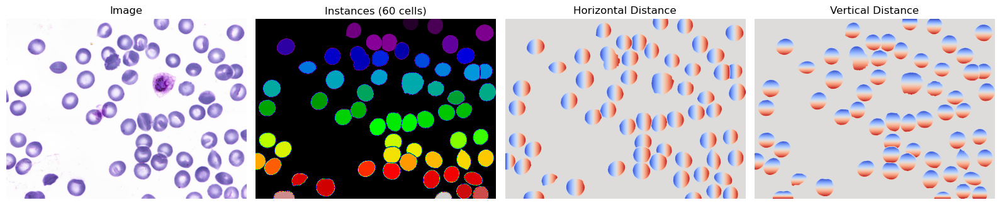

In [10]:
def generate_hv_map(instance_map):
    """
    Generate horizontal/vertical distance maps from instance segmentation.

    For each instance: compute normalized distance from each pixel to
    the instance centroid, in range [-1, +1].

    Returns: (H, W, 2) float32 array [horizontal, vertical]
    """
    hv_map = np.zeros((*instance_map.shape, 2), dtype=np.float32)
    instance_ids = np.unique(instance_map)
    instance_ids = instance_ids[instance_ids > 0]

    for inst_id in instance_ids:
        inst_mask = (instance_map == inst_id)
        # Bounding box for efficiency
        rows = np.any(inst_mask, axis=1)
        cols = np.any(inst_mask, axis=0)
        rmin, rmax = np.where(rows)[0][[0, -1]]
        cmin, cmax = np.where(cols)[0][[0, -1]]

        pad = 2
        rmin_p = max(0, rmin - pad)
        rmax_p = min(instance_map.shape[0], rmax + pad + 1)
        cmin_p = max(0, cmin - pad)
        cmax_p = min(instance_map.shape[1], cmax + pad + 1)

        crop_mask = inst_mask[rmin_p:rmax_p, cmin_p:cmax_p]
        cy, cx = center_of_mass(crop_mask)

        y_grid, x_grid = np.mgrid[0:crop_mask.shape[0], 0:crop_mask.shape[1]]
        x_dist = (x_grid - cx).astype(np.float32)
        y_dist = (y_grid - cy).astype(np.float32)

        x_dist[~crop_mask] = 0
        y_dist[~crop_mask] = 0

        x_valid = x_dist[crop_mask]
        y_valid = y_dist[crop_mask]

        # Normalize to [-1, 1]
        if len(x_valid) > 0:
            x_min_abs = abs(x_valid.min()) if x_valid.min() < 0 else 1
            x_max_abs = x_valid.max() if x_valid.max() > 0 else 1
            x_dist_norm = x_dist.copy()
            neg_mask = crop_mask & (x_dist < 0)
            pos_mask = crop_mask & (x_dist > 0)
            if neg_mask.any() and x_min_abs > 0:
                x_dist_norm[neg_mask] = x_dist[neg_mask] / (x_min_abs + 1e-8)
            if pos_mask.any() and x_max_abs > 0:
                x_dist_norm[pos_mask] = x_dist[pos_mask] / (x_max_abs + 1e-8)
            x_dist_norm[~crop_mask] = 0

            y_min_abs = abs(y_valid.min()) if y_valid.min() < 0 else 1
            y_max_abs = y_valid.max() if y_valid.max() > 0 else 1
            y_dist_norm = y_dist.copy()
            neg_mask = crop_mask & (y_dist < 0)
            pos_mask = crop_mask & (y_dist > 0)
            if neg_mask.any() and y_min_abs > 0:
                y_dist_norm[neg_mask] = y_dist[neg_mask] / (y_min_abs + 1e-8)
            if pos_mask.any() and y_max_abs > 0:
                y_dist_norm[pos_mask] = y_dist[pos_mask] / (y_max_abs + 1e-8)
            y_dist_norm[~crop_mask] = 0

            hv_map[rmin_p:rmax_p, cmin_p:cmax_p, 0] += x_dist_norm
            hv_map[rmin_p:rmax_p, cmin_p:cmax_p, 1] += y_dist_norm

    return hv_map


# Test HV map generation
hv_map = generate_hv_map(inst_map)
print(f"HV map: shape={hv_map.shape}, range=[{hv_map.min():.3f}, {hv_map.max():.3f}]")

# Visualize
fig, axes = plt.subplots(1, 4, figsize=(16, 4))
axes[0].imshow(sample_img)
axes[0].set_title('Image')
axes[1].imshow(inst_map, cmap='nipy_spectral')
axes[1].set_title(f'Instances ({inst_map.max()} cells)')
axes[2].imshow(hv_map[:, :, 0], cmap='coolwarm', vmin=-1, vmax=1)
axes[2].set_title('Horizontal Distance')
axes[3].imshow(hv_map[:, :, 1], cmap='coolwarm', vmin=-1, vmax=1)
axes[3].set_title('Vertical Distance')
for ax in axes:
    ax.axis('off')
plt.tight_layout()
plt.savefig(f'{RESULTS_DIR}/hv_map_sample.png', dpi=150, bbox_inches='tight')
plt.show()

In [11]:
def process_and_save(pairs, output_dir, target_size=256):
    # We can skip saving the hv maps; they are not necessary for further processing.
    """
    Process all image-mask pairs and save to output_dir:
    - images/ : resized RGB PNG
    - instance_maps/ : uint16 .npy
    - class_maps/ : uint8 .npy
    """
    stats = Counter()
    for idx, (img_path, mask_path) in enumerate(tqdm(pairs, desc=f'Processing {output_dir}')):
        stem = Path(img_path).stem

        # Load
        img = np.array(Image.open(img_path).convert('RGB'))
        mask = np.array(Image.open(mask_path))

        # Parse mask -> instances + classes
        inst_map, cls_map = parse_mask_to_instances(mask, color_to_class)

        # Resize (bilinear for image, nearest for maps)
        img_resized = cv2.resize(img, (target_size, target_size),
                                 interpolation=cv2.INTER_LINEAR)
        inst_resized = cv2.resize(inst_map, (target_size, target_size),
                                  interpolation=cv2.INTER_NEAREST)
        cls_resized = cv2.resize(cls_map, (target_size, target_size),
                                 interpolation=cv2.INTER_NEAREST)

        # Re-label instances after resize (some may merge)
        new_inst_map = np.zeros_like(inst_resized)
        new_id = 1
        for old_id in np.unique(inst_resized):
            if old_id == 0:
                continue
            region = (inst_resized == old_id)
            # Re-split in case resize merged components
            labeled, n = skimage_label(region, return_num=True)
            for j in range(1, n + 1):
                comp = (labeled == j)
                if comp.sum() < 3:
                    continue
                new_inst_map[comp] = new_id
                new_id += 1
        inst_resized = new_inst_map

        # Save
        Image.fromarray(img_resized).save(
            os.path.join(output_dir, 'images', f'{stem}.png'))
        np.save(os.path.join(output_dir, 'instance_maps', f'{stem}.npy'), inst_resized)
        np.save(os.path.join(output_dir, 'class_maps', f'{stem}.npy'), cls_resized)

        # Count class distribution
        for c in np.unique(cls_resized):
            if c > 0:
                stats[CLASS_NAMES.get(c, f'cls_{c}')] += int((cls_resized == c).sum())

    print(f"Processed {len(pairs)} pairs. Pixel class distribution: {dict(stats)}")


# Split training data into train/val (85/15)
train_idx, val_idx = train_test_split(
    range(len(train_pairs)), test_size=0.15, random_state=SEED
)
train_split = [train_pairs[i] for i in train_idx]
val_split = [train_pairs[i] for i in val_idx]

print(f"Train: {len(train_split)}, Val: {len(val_split)}, Test: {len(test_pairs)}")

# Process all splits (uses PROCESSED_DIR)
process_and_save(train_split, f'{PROCESSED_DIR}/train', RESIZE_SIZE)
process_and_save(val_split, f'{PROCESSED_DIR}/val', RESIZE_SIZE)
process_and_save(test_pairs, f'{PROCESSED_DIR}/test', RESIZE_SIZE)

Train: 993, Val: 176, Test: 159


Processing data/processed/train:   0%|          | 0/993 [00:00<?, ?it/s]

Processed 993 pairs. Pixel class distribution: {'RBC': 19031775}


Processing data/processed/val:   0%|          | 0/176 [00:00<?, ?it/s]

Processed 176 pairs. Pixel class distribution: {'RBC': 3323004}


Processing data/processed/test:   0%|          | 0/159 [00:00<?, ?it/s]

Processed 159 pairs. Pixel class distribution: {'RBC': 3229311}


## 3. Dataset & DataLoaders

Two-phase augmentation strategy:
1. **Geometric** (applied to image + all masks jointly) → then recompute HV maps from the transformed instance map
2. **Photometric** (applied to image only — masks unchanged)

This is critical because geometric transforms (rotation, scale, elastic) invalidate the pre-computed HV distance maps.

In [12]:
# Phase 1: Geometric transforms — applied jointly to image, instance_map, class_map
# After these, we MUST recompute the HV map from the transformed instance_map.
# Seems redundant, but a rotation or flip changes the spatial relationship between pixels and instance centroids, so the old HV values are invalid
geometric_transform = A.Compose([
    A.RandomCrop(INPUT_SIZE, INPUT_SIZE),   # 256 -> 224
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
    A.ShiftScaleRotate(
        shift_limit=0.1, scale_limit=0.2, rotate_limit=45,
        border_mode=cv2.BORDER_CONSTANT, value=0, mask_value=0, p=0.7
    ),
    A.OneOf([
        A.ElasticTransform(alpha=80, sigma=80 * 0.05, border_mode=cv2.BORDER_CONSTANT, p=0.5),
        A.GridDistortion(num_steps=5, distort_limit=0.3, border_mode=cv2.BORDER_CONSTANT, p=0.5),
    ], p=0.3),
], additional_targets={'class_map': 'mask'})

# Phase 2: Photometric transforms — applied to image only
photometric_transform = A.Compose([
    A.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.1, p=0.8),
    A.GaussianBlur(blur_limit=(3, 7), p=0.3),
    A.GaussNoise(var_limit=(10.0, 50.0), p=0.3),
    A.CoarseDropout(max_holes=8, max_height=16, max_width=16, fill_value=0, p=0.3),
])

# Validation: deterministic center crop only
val_transform = A.Compose([
    A.CenterCrop(INPUT_SIZE, INPUT_SIZE),
], additional_targets={'class_map': 'mask'})

# ImageNet normalization constants (UNI was pretrained with these)
IMAGENET_MEAN = np.array([0.485, 0.456, 0.406], dtype=np.float32)
IMAGENET_STD = np.array([0.229, 0.224, 0.225], dtype=np.float32)

In [13]:
class BCCDInstanceDataset(Dataset):
    """
    PyTorch Dataset for BCCD cell instance segmentation.

    Returns:
        image: (3, H, W) float32 tensor, ImageNet-normalized
        targets: dict with:
            'np_map':       (1, H, W) binary cell mask
            'hv_map':       (2, H, W) horizontal/vertical distance maps
            'class_map':    (H, W) long tensor, per-pixel class label
            'instance_map': (H, W) int tensor (for eval only, not used in loss)
    """

    def __init__(self, data_dir, is_train=True):
        self.data_dir = Path(data_dir)
        self.is_train = is_train

        self.image_files = sorted(self.data_dir.glob('images/*.png'))
        if len(self.image_files) == 0:
            raise RuntimeError(f"No images found in {self.data_dir / 'images'}")
        print(f"BCCDInstanceDataset: {len(self.image_files)} samples from {data_dir}")

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        stem = self.image_files[idx].stem

        # Load pre-processed instance and class maps
        img = np.array(Image.open(self.image_files[idx]))  # (H, W, 3) uint8
        inst_map = np.load(self.data_dir / 'instance_maps' / f'{stem}.npy')  # (H, W) uint16
        cls_map = np.load(self.data_dir / 'class_maps' / f'{stem}.npy')      # (H, W) uint8

        if self.is_train:
            # Phase 1: Geometric transforms (invalidates HV maps)
            augmented = geometric_transform(
                image=img, mask=inst_map.astype(np.int32), class_map=cls_map.astype(np.int32)
            )
            img = augmented['image']
            inst_map = augmented['mask'].astype(np.uint16)
            cls_map = augmented['class_map'].astype(np.uint8)

            # Re-label instances after geometric transform
            new_inst = np.zeros_like(inst_map)
            new_id = 1
            for uid in np.unique(inst_map):
                if uid == 0:
                    continue
                region = (inst_map == uid)
                labeled, n = skimage_label(region, return_num=True)
                for j in range(1, n + 1):
                    comp = (labeled == j)
                    if comp.sum() >= 3:
                        new_inst[comp] = new_id
                        new_id += 1
            inst_map = new_inst

            # Recompute HV map from transformed instance map
            hv_map = generate_hv_map(inst_map)

            # Phase 2: Photometric transforms (image only)
            augmented = photometric_transform(image=img)
            img = augmented['image']
        else:
            # Validation: deterministic center crop
            augmented = val_transform(
                image=img, mask=inst_map.astype(np.int32), class_map=cls_map.astype(np.int32)
            )
            img = augmented['image']
            inst_map = augmented['mask'].astype(np.uint16)
            cls_map = augmented['class_map'].astype(np.uint8)

            # Recompute HV map for the cropped region
            hv_map = generate_hv_map(inst_map)

        # Convert to tensors
        # Image: normalize to ImageNet stats
        img_float = img.astype(np.float32) / 255.0
        img_float = (img_float - IMAGENET_MEAN) / IMAGENET_STD
        img_tensor = torch.from_numpy(img_float).permute(2, 0, 1)  # (3, H, W)

        # Binary nuclear pixel map
        np_map = (inst_map > 0).astype(np.float32)
        np_tensor = torch.from_numpy(np_map).unsqueeze(0)  # (1, H, W)

        # HV map
        hv_tensor = torch.from_numpy(hv_map).permute(2, 0, 1)  # (2, H, W)

        # Class map (long for CE loss)
        cls_tensor = torch.from_numpy(cls_map.astype(np.int64))  # (H, W)

        # Instance map (for evaluation)
        inst_tensor = torch.from_numpy(inst_map.astype(np.int32))  # (H, W)

        targets = {
            'np_map': np_tensor,
            'hv_map': hv_tensor,
            'class_map': cls_tensor,
            'instance_map': inst_tensor,
        }

        return img_tensor, targets

In [14]:
# ============================================================
# Create DataLoaders
# ============================================================
train_dataset = BCCDInstanceDataset(f'{PROCESSED_DIR}/train', is_train=True)
val_dataset = BCCDInstanceDataset(f'{PROCESSED_DIR}/val', is_train=False)
test_dataset = BCCDInstanceDataset(f'{PROCESSED_DIR}/test', is_train=False)

#We shuffle the order in the training set to maintain unbiased and avoid overfitting.
# DDP samplers (None when single-GPU)
train_sampler = DistributedSampler(train_dataset, shuffle=True) if DDP_ACTIVE else None
val_sampler = DistributedSampler(val_dataset, shuffle=False) if DDP_ACTIVE else None

train_loader = DataLoader(
    train_dataset, batch_size=BATCH_SIZE,
    shuffle=(train_sampler is None),  # shuffle only when not using DDP sampler
    sampler=train_sampler,
    num_workers=NUM_WORKERS, pin_memory=True, drop_last=True
)
val_loader = DataLoader(
    val_dataset, batch_size=BATCH_SIZE, shuffle=False,
    sampler=val_sampler,
    num_workers=NUM_WORKERS, pin_memory=True
)
test_loader = DataLoader(
    test_dataset, batch_size=1, shuffle=False,
    num_workers=0, pin_memory=True
)

# Sanity check: load one batch
imgs, targets = next(iter(train_loader))
print(f"Image batch: {imgs.shape}, dtype={imgs.dtype}")
for k, v in targets.items():
    print(f"  {k}: {v.shape}, dtype={v.dtype}, range=[{v.min():.2f}, {v.max():.2f}]")

BCCDInstanceDataset: 993 samples from data/processed/train
BCCDInstanceDataset: 176 samples from data/processed/val
BCCDInstanceDataset: 159 samples from data/processed/test
Image batch: torch.Size([16, 3, 224, 224]), dtype=torch.float32
  np_map: torch.Size([16, 1, 224, 224]), dtype=torch.float32, range=[0.00, 1.00]
  hv_map: torch.Size([16, 2, 224, 224]), dtype=torch.float32, range=[-1.00, 1.00]
  class_map: torch.Size([16, 224, 224]), dtype=torch.int64, range=[0.00, 1.00]
  instance_map: torch.Size([16, 224, 224]), dtype=torch.int32, range=[0.00, 101.00]


## 4. Model Architecture

**Design rationale:**

| Component | Choice | Reason |
|-----------|--------|-----|
| **Backbone** | UNI ViT-L/16 (frozen) | Pre-trained on 100M+ pathology patches via DINOv2 (self supervision). Encodes cell morphology, staining patterns, and nuclear texture directly relevant to blood cell analysis. 304M parameters frozen = no overfitting on 364 images. |
| **Feature extraction** | Blocks [5, 11, 17, 23] | 1/4, 1/2, 3/4, full depth — captures both low-level edges (block 5) and high-level semantic features (block 23). All produce 14×14 spatial maps. |
| **Feature Pyramid** | Dense Prediction Transformer (DPT)-style reassembly + RefineNet fusion | ViT produces constant-resolution features (unlike CNNs). DPT progressively upsamples to 112×112, creating multi-scale representation needed for dense prediction and fine-grained segmentation. |
| **Decoder** | 3-branch HoVer-Net inspired | **Nuclear Pixel (NP)**: simple binary nuclear mask. **HV**: horizontal/vertical distance regression separates overlapping cells (possibly mitotic figures) via gradient-based watershed. **Nuclear Classification (NC)**: per-pixel classification for cell identification (the best branch!). This is standard in computational pathology for instance segmentation of densely packed cells. |
| **LoRA** | Rank-4 on attention Query/Value | Phase 2 fine-tuning with only ~720K extra parameters. Proven most effective fine-tuning strategy for pathology ViTs (outperforms full fine-tuning on small datasets). |

In [15]:
# ============================================================
# 4a. UNI Backbone Wrapper
# ============================================================

class UNIBackbone(nn.Module):
    """
    Wraps the UNI ViT-L/16 model for multi-scale feature extraction.

    UNI v1: vit_large_patch16_224, embed_dim=1024, 24 blocks, 16 heads.
    For 224x224 input → 14x14 = 196 patches per layer.

    Extracts features from blocks [5, 11, 17, 23] (0-indexed).
    Each feature: (B, 1024, 14, 14) after spatial reshape.
    """

    EXTRACT_INDICES = [5, 11, 17, 23]

    def __init__(self, pretrained=True, frozen=True):
        super().__init__()
        try:
            self.model = timm.create_model(
                "hf-hub:MahmoodLab/uni",
                pretrained=pretrained,
                init_values=1e-5,
                dynamic_img_size=True,
            )
            print("Loaded UNI backbone from HuggingFace :).")
        except Exception as e:
            print(f"Could not load UNI weights ({e}).")
            print("Falling back to ImageNet-pretrained ViT-L/16.")
            self.model = timm.create_model(
                "vit_large_patch16_224",
                pretrained=True,
                dynamic_img_size=True,
            )

        self.embed_dim = self.model.embed_dim  # 1024
        self.patch_size = 16

        if frozen:
            self.freeze()

    def freeze(self):
        for param in self.model.parameters():
            param.requires_grad = False
        self.model.eval()

    def forward(self, x):
        """
        Args:  x: (B, 3, H, W)
        Returns: list of 4 tensors, each (B, 1024, H/16, W/16)
        """
        features = self.model.forward_intermediates(
            x,
            indices=self.EXTRACT_INDICES,
            intermediates_only=True,
        )
        return features  # list of (B, C, H', W')

    def train(self, mode=True):
        # Keep backbone in eval mode always (for frozen BN / LayerNorm)
        super().train(mode)
        self.model.eval()
        return self

In [16]:
# =======================================================================
# 4b. Dense Prediction Transformer-Style Multi-Resolution Feature Pyramid
# =======================================================================

class Reassemble(nn.Module):
    """Project ViT features and upsample to a target resolution."""

    def __init__(self, in_channels=1024, out_channels=256, upsample_factor=1):
        super().__init__()
        self.project = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=1),
            nn.BatchNorm2d(out_channels),
            nn.GELU(),
        )
        layers = []
        current = 1
        while current < upsample_factor:
            layers.extend([
                nn.ConvTranspose2d(out_channels, out_channels,
                                   kernel_size=4, stride=2, padding=1),
                nn.BatchNorm2d(out_channels),
                nn.GELU(),
            ])
            current *= 2
        self.upsample = nn.Sequential(*layers) if layers else nn.Identity()

    def forward(self, x):
        return self.upsample(self.project(x))


class FusionBlock(nn.Module):
    """RefineNet-style residual fusion: upsample coarse + add fine + refine."""

    def __init__(self, channels=256):
        super().__init__()
        self.refine = nn.Sequential(
            nn.Conv2d(channels, channels, 3, padding=1),
            nn.BatchNorm2d(channels),
            nn.GELU(),
            nn.Conv2d(channels, channels, 3, padding=1),
            nn.BatchNorm2d(channels),
            nn.GELU(),
        )

    def forward(self, coarse, fine):
        coarse_up = F.interpolate(coarse, size=fine.shape[2:],
                                  mode='bilinear', align_corners=False)
        fused = coarse_up + fine
        return fused + self.refine(fused)


class FeaturePyramid(nn.Module):
    """
    Creates a multi-scale feature pyramid from 4 same-resolution ViT features.

    Layer 23 (deepest)  -> 14x14   (no upsample)
    Layer 17            -> 28x28   (2x upsample)
    Layer 11            -> 56x56   (4x upsample)
    Layer 5  (earliest) -> 112x112 (8x upsample)

    Then fuses coarse-to-fine using RefineNet blocks.
    Output: (B, 256, 112, 112)
    """
    PYRAMID_CHANNELS = 256

    def __init__(self, embed_dim=1024):
        super().__init__()
        C = self.PYRAMID_CHANNELS
        # Reassemble: deepest first
        self.reassemble = nn.ModuleList([
            Reassemble(embed_dim, C, upsample_factor=1),  # 14x14
            Reassemble(embed_dim, C, upsample_factor=2),  # 28x28
            Reassemble(embed_dim, C, upsample_factor=4),  # 56x56
            Reassemble(embed_dim, C, upsample_factor=8),  # 112x112
        ])
        self.fusions = nn.ModuleList([
            FusionBlock(C),  # 14->28
            FusionBlock(C),  # 28->56
            FusionBlock(C),  # 56->112
        ])

    def forward(self, features):
        """
        Args: features = [layer5, layer11, layer17, layer23], each (B, 1024, 14, 14)
        Returns: (B, 256, 112, 112)
        """
        # Reassemble in reverse order (deepest first)
        r = [self.reassemble[i](features[3 - i]) for i in range(4)]
        # r[0]=(B,256,14,14), r[1]=(B,256,28,28), r[2]=(B,256,56,56), r[3]=(B,256,112,112)

        fused = r[0]
        for i, fusion in enumerate(self.fusions):
            fused = fusion(fused, r[i + 1])
        return fused  # (B, 256, 112, 112)

In [17]:
# ============================================================
# 4c. Decoder Heads + Full Model
# ============================================================

class DecoderHead(nn.Module):
    """
    Takes fused features (B, 256, 112, 112) and produces output at
    original resolution (B, out_ch, 224, 224).
    """

    def __init__(self, in_channels=256, mid_channels=128, out_channels=1):
        super().__init__()
        self.head = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False),
            nn.Conv2d(in_channels, mid_channels, 3, padding=1),
            nn.BatchNorm2d(mid_channels),
            nn.GELU(),
            nn.Dropout2d(0.1),
            nn.Conv2d(mid_channels, mid_channels, 3, padding=1),
            nn.BatchNorm2d(mid_channels),
            nn.GELU(),
            nn.Conv2d(mid_channels, out_channels, 1),
        )

    def forward(self, x):
        return self.head(x)


class CellSegModel(nn.Module):
    """
    Complete cell instance segmentation model.

    UNI ViT-L/16 → Feature Pyramid → 3 decoder heads:
      - np_head: (B, 1, 224, 224)  nuclear pixel logits
      - hv_head: (B, 2, 224, 224)  h/v distance predictions
      - nc_head: (B, C, 224, 224)  classification logits

    Trainable params (backbone frozen): ~11M
    Frozen params (backbone):           ~304M
    """

    def __init__(self, num_classes=NUM_CLASSES, pretrained_backbone=True,
                 freeze_backbone=True):
        super().__init__()
        self.backbone = UNIBackbone(pretrained=pretrained_backbone,
                                    frozen=freeze_backbone)
        self.feature_pyramid = FeaturePyramid(embed_dim=self.backbone.embed_dim)

        C = FeaturePyramid.PYRAMID_CHANNELS  # 256
        self.np_head = DecoderHead(C, 128, 1)           # Binary segmentation
        self.hv_head = DecoderHead(C, 128, 2)           # H/V distance regression
        self.nc_head = DecoderHead(C, 128, num_classes)  # Classification

    def forward(self, x):
        features = self.backbone(x)
        fused = self.feature_pyramid(features)
        return {
            'np': self.np_head(fused),
            'hv': self.hv_head(fused),
            'nc': self.nc_head(fused),
        }

    def count_parameters(self):
        trainable = sum(p.numel() for p in self.parameters() if p.requires_grad)
        frozen = sum(p.numel() for p in self.parameters() if not p.requires_grad)
        total = trainable + frozen
        return {'trainable': trainable, 'frozen': frozen, 'total': total}

In [18]:
# ============================================================
# 4d. LoRA for Phase 2 Fine-Tuning
# ============================================================

class LoRALinear(nn.Module):
    """
    Low-Rank Adaptation for nn.Linear.
    Output = Wx + (alpha/rank) * B @ A @ x

    Only A and B are trainable; original W is frozen.
    """

    def __init__(self, original_linear, rank=4, alpha=4.0):
        super().__init__()
        self.original = original_linear
        self.rank = rank
        self.alpha = alpha

        in_f = original_linear.in_features
        out_f = original_linear.out_features

        # Freeze original
        self.original.weight.requires_grad = False
        if self.original.bias is not None:
            self.original.bias.requires_grad = False

        # Trainable low-rank matrices
        self.lora_A = nn.Parameter(torch.randn(rank, in_f) * 0.01)
        self.lora_B = nn.Parameter(torch.zeros(out_f, rank))

    def forward(self, x):
        orig_out = self.original(x)
        lora_out = (x @ self.lora_A.T) @ self.lora_B.T
        return orig_out + (self.alpha / self.rank) * lora_out


def apply_lora(model, rank=4, alpha=4.0):
    """Apply LoRA to all attention QKV projections in the UNI backbone."""
    lora_params = 0
    for block in model.backbone.model.blocks:
        original_qkv = block.attn.qkv
        lora_layer = LoRALinear(original_qkv, rank=rank, alpha=alpha)
        block.attn.qkv = lora_layer
        lora_params += lora_layer.lora_A.numel() + lora_layer.lora_B.numel()
    print(f"Applied LoRA (rank={rank}) to {len(model.backbone.model.blocks)} blocks. "
          f"Added {lora_params:,} trainable parameters.")
    return model

In [19]:
# ===================================
# 4e. Instantiate Model + Smoke Test
# ===================================
model = CellSegModel(
    num_classes=NUM_CLASSES,
    pretrained_backbone=True,
    freeze_backbone=True,
).to(DEVICE)

params = model.count_parameters()
print(f"Model parameters:")
print(f"  Trainable: {params['trainable']:>12,}")
print(f"  Frozen:    {params['frozen']:>12,}")
print(f"  Total:     {params['total']:>12,}")

# Smoke test with random input
with torch.no_grad():
    dummy = torch.randn(2, 3, INPUT_SIZE, INPUT_SIZE).to(DEVICE)
    out = model(dummy)
    print(f"\nSmoke test passed:")
    for k, v in out.items():
        print(f"  {k}: {v.shape}")
    del dummy, out
    torch.cuda.empty_cache()


# Optional: torch.compile for faster training (PyTorch 2.x)
if USE_COMPILE and hasattr(torch, 'compile'):
    print("Compiling model with torch.compile (mode='default')...")
    model = torch.compile(model, mode='default')
    print("  Compilation will happen on first forward pass (expect ~30s delay).")

# Wrap with DDP if active (must be AFTER compile)
if DDP_ACTIVE:
    model = DDP_Module(model, device_ids=[LOCAL_RANK])
    if is_main_process():
        print(f"Model wrapped with DistributedDataParallel on GPU {LOCAL_RANK}")

Could not load UNI weights (403 Client Error. (Request ID: Root=1-69839401-5c3281b73c07c1640e042260;5ccc062a-8a9e-4f11-ba78-0c4d21834316)

Cannot access gated repo for url https://huggingface.co/MahmoodLab/uni/resolve/main/config.json.
Your request to access model MahmoodLab/UNI is awaiting a review from the repo authors.).
Falling back to ImageNet-pretrained ViT-L/16.
Model parameters:
  Trainable:   12,221,575
  Frozen:     304,326,632
  Total:      316,548,207

Smoke test passed:
  np: torch.Size([2, 1, 224, 224])
  hv: torch.Size([2, 2, 224, 224])
  nc: torch.Size([2, 4, 224, 224])


For cell segmentation, since UNI is a domain-specific backbone, it would give noticeably better results, especially with a small dataset. Access to UNI is dependent on approval from Faisal Mahmood's lab (a close colleague of ours), so we should be granted access to it. However, if we don't, we rely on using ImageNet-pretrained ViT-L/16 as a backup, since it is open access.

## 5. Loss Functions

The combined loss function will be a weighted sum of the loss of each attention branch in the decoder. Note the computed losses will have some randomness if this cell block is recomputed as is the nature of the initial random weights for the QVK matrices. However, the total loss hovers around 7.2 with low variance, which is a green flag for stability.

**Multi-task loss**: `L_total = w_np * L_np + w_hv * L_hv + w_nc * L_nc`

| Branch | Loss | Rationale |
|--------|------|-----------|
| **NP** (binary seg) | BCE + Dice | BCE provides per-pixel gradient; Dice handles class imbalance (background >> cells). |
| **HV** (distance) | MSE + MSGE | MSE drives overall regression accuracy; MSGE (Mean Squared Gradient Error via Sobel) enforces sharp transitions at instance boundaries — critical for watershed separation. **Weight = 2×** because this is the key innovation enabling instance separation. |
| **NC** (classification) | Weighted CE + Dice | CE with inverse-frequency weights (RBC=0.5, WBC=5.0, Platelet=8.0) compensates for massive class imbalance. Dice per class adds overlap-based signal. |

In [21]:
class CombinedLoss(nn.Module):
    """
    Multi-task loss for the 3-branch HoVer-Net decoder.

    L_total = w_np * (BCE + Dice) + w_hv * (MSE + MSGE) + w_nc * (CE + Dice)
    """

    def __init__(self, weight_np=1.0, weight_hv=2.0, weight_nc=2.0,
                 class_weights=None):
        super().__init__()
        self.w_np = weight_np
        self.w_hv = weight_hv
        self.w_nc = weight_nc

        self.bce = nn.BCEWithLogitsLoss()
        self.mse = nn.MSELoss()
        cw = class_weights.to(DEVICE) if class_weights is not None else None
        self.ce = nn.CrossEntropyLoss(weight=cw)

        # Sobel kernels for MSGE (registered as buffers so they move with .to())
        sobel_x = torch.tensor([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]],
                               dtype=torch.float32).view(1, 1, 3, 3)
        sobel_y = sobel_x.transpose(2, 3)
        self.register_buffer('sobel_x', sobel_x)
        self.register_buffer('sobel_y', sobel_y)

    @staticmethod
    def dice_loss(pred, target, smooth=1.0):
        pred_flat = pred.contiguous().view(-1)
        tgt_flat = target.contiguous().view(-1)
        inter = (pred_flat * tgt_flat).sum()
        return 1 - (2. * inter + smooth) / (pred_flat.sum() + tgt_flat.sum() + smooth)

    def msge_loss(self, pred_hv, target_hv, focus_mask):
        """Mean Squared Gradient Error — sharpens boundary predictions."""
        loss = torch.tensor(0.0, device=pred_hv.device)
        mask = focus_mask.unsqueeze(1).float()
        num_pixels = mask.sum().clamp(min=1)

        for ch in range(2):
            p = pred_hv[:, ch:ch+1]
            t = target_hv[:, ch:ch+1]
            # Sobel gradients
            pgx = F.conv2d(p, self.sobel_x, padding=1)
            pgy = F.conv2d(p, self.sobel_y, padding=1)
            tgx = F.conv2d(t, self.sobel_x, padding=1)
            tgy = F.conv2d(t, self.sobel_y, padding=1)
            # Masked MSE on gradients
            loss = loss + ((pgx - tgx) ** 2 * mask).sum() / num_pixels
            loss = loss + ((pgy - tgy) ** 2 * mask).sum() / num_pixels

        return loss / 4.0

    def forward(self, preds, targets):
        # --- NP branch ---
        np_bce = self.bce(preds['np'], targets['np_map'])
        np_dice = self.dice_loss(torch.sigmoid(preds['np']), targets['np_map'])
        np_loss = np_bce + np_dice

        # --- HV branch (masked to cell regions) ---
        focus = (targets['np_map'].squeeze(1) > 0.5)
        mask_f = focus.unsqueeze(1).float()
        hv_mse = self.mse(preds['hv'] * mask_f, targets['hv_map'] * mask_f)
        hv_msge = self.msge_loss(preds['hv'], targets['hv_map'], focus)
        hv_loss = hv_mse + hv_msge

        # --- NC branch ---
        nc_ce = self.ce(preds['nc'], targets['class_map'])
        nc_softmax = F.softmax(preds['nc'], dim=1)
        nc_dice = torch.tensor(0.0, device=preds['nc'].device)
        for c in range(1, nc_softmax.shape[1]):
            nc_dice = nc_dice + self.dice_loss(
                nc_softmax[:, c], (targets['class_map'] == c).float()
            )
        nc_dice = nc_dice / max(nc_softmax.shape[1] - 1, 1)
        nc_loss = nc_ce + nc_dice

        total = self.w_np * np_loss + self.w_hv * hv_loss + self.w_nc * nc_loss

        return {
            'total': total,
            'np_loss': np_loss.detach(),
            'hv_loss': hv_loss.detach(),
            'nc_loss': nc_loss.detach(),
        }


criterion = CombinedLoss(
    weight_np=1.0, weight_hv=2.0, weight_nc=2.0,
    class_weights=CLASS_WEIGHTS,
).to(DEVICE)

# Sanity check loss on one batch
with torch.no_grad():
    imgs_v, tgts_v = next(iter(val_loader))
    imgs_v = imgs_v.to(DEVICE)
    tgts_v = {k: v.to(DEVICE) for k, v in tgts_v.items()}
    out_v = model(imgs_v)
    losses_v = criterion(out_v, tgts_v)
    print("Total loss sanity check:")
    for k, v in losses_v.items():
        print(f"  {k}: {v.item():.4f}")
    del imgs_v, tgts_v, out_v, losses_v
    torch.cuda.empty_cache()

Total loss sanity check:
  total: 9.3335
  np_loss: 1.2990
  hv_loss: 1.6990
  nc_loss: 2.3183


## 6. Training Phase 1 - Decoder Only (Backbone Frozen)

| Hyperparameter | Value | Rationale |
|---|---|---|
| Epochs | 100 | Small dataset, frozen backbone converges fast |
| Batch size | 16 | Fits comfortably in 32GB V100 with frozen backbone |
| Optimizer | AdamW | Standard for transformer architectures |
| Learning rate | 1e-3 | Higher LR justified since decoder trains from scratch |
| Mixed precision | fp16 | Halves VRAM, faster on V100 (use bp16 for A100) |
| Early stopping | patience=15 | Prevent overfitting on small dataset |

In [22]:
# ============================================================
# Training & Validation Loops
# ============================================================

def train_one_epoch(model, loader, criterion, optimizer, scaler, epoch):
    model.train()
    running = defaultdict(float)

    pbar = tqdm(loader, desc=f'Train E{epoch}', leave=False)
    for images, targets in pbar:
        images = images.to(DEVICE)
        targets = {k: v.to(DEVICE) for k, v in targets.items()}

        optimizer.zero_grad(set_to_none=True)
    
        # This syntax is for PyTorch 2.1
        with torch.cuda.amp.autocast(dtype=torch.float16):
            preds = model(images)
            losses = criterion(preds, targets)

        scaler.scale(losses['total']).backward()
        scaler.unscale_(optimizer)
        torch.nn.utils.clip_grad_norm_(
            [p for p in model.parameters() if p.requires_grad], max_norm=1.0
        )
        scaler.step(optimizer)
        scaler.update()

        for k in ['total', 'np_loss', 'hv_loss', 'nc_loss']:
            running[k] += losses[k].item() if k != 'total' else losses['total'].item()

        pbar.set_postfix(loss=f"{losses['total'].item():.4f}")

    n = len(loader)
    return {k: v / n for k, v in running.items()}


@torch.no_grad()
def validate(model, loader, criterion):
    model.eval()
    running = defaultdict(float)

    for images, targets in tqdm(loader, desc='Val', leave=False):
        images = images.to(DEVICE)
        targets = {k: v.to(DEVICE) for k, v in targets.items()}

        with torch.cuda.amp.autocast(dtype=torch.float16):
            preds = model(images)
            losses = criterion(preds, targets)

        for k in ['total', 'np_loss', 'hv_loss', 'nc_loss']:
            running[k] += losses[k].item() if k != 'total' else losses['total'].item()

    n = len(loader)
    return {k: v / n for k, v in running.items()}

In [23]:
# ============================================================
# Checkpoint Resume Helpers — survive VPN/session disconnects
# ============================================================

def save_latest_checkpoint(path, model, optimizer, scheduler, scaler,
                           epoch, best_val_loss, patience_counter, history,
                           warmup_scheduler=None):
    """Save resumable checkpoint every epoch (atomic write).
    
    Overwrites previous 'latest' checkpoint. If the process dies mid-write,
    the .tmp file is corrupt but the previous checkpoint remains intact.
    """
    if not is_main_process():
        return
    ckpt = {
        'epoch': epoch,
        'model_state_dict': (model.module.state_dict() if DDP_ACTIVE else model.state_dict()),
        'optimizer_state_dict': optimizer.state_dict(),
        'scheduler_state_dict': scheduler.state_dict(),
        'scaler_state_dict': scaler.state_dict(),
        'best_val_loss': best_val_loss,
        'patience_counter': patience_counter,
        'history': dict(history),
    }
    if warmup_scheduler is not None:
        ckpt['warmup_scheduler_state_dict'] = warmup_scheduler.state_dict()
    # Atomic write: save to tmp then rename
    tmp_path = path + '.tmp'
    torch.save(ckpt, tmp_path)
    os.replace(tmp_path, path)


def load_latest_checkpoint(path, model, optimizer, scheduler, scaler,
                           warmup_scheduler=None):
    """Load latest checkpoint for resume.
    
    Returns (start_epoch, best_val_loss, patience_counter, history) or None.
    """
    if not os.path.exists(path):
        return None
    print(f"  \u2714 Found latest checkpoint: {path}")
    ckpt = torch.load(path, map_location=DEVICE, weights_only=False)
    base_model = model.module if DDP_ACTIVE else model
    base_model.load_state_dict(ckpt['model_state_dict'])
    optimizer.load_state_dict(ckpt['optimizer_state_dict'])
    scheduler.load_state_dict(ckpt['scheduler_state_dict'])
    scaler.load_state_dict(ckpt['scaler_state_dict'])
    if warmup_scheduler is not None and 'warmup_scheduler_state_dict' in ckpt:
        warmup_scheduler.load_state_dict(ckpt['warmup_scheduler_state_dict'])
    start_epoch = ckpt['epoch'] + 1  # Resume from NEXT epoch
    best_val_loss = ckpt['best_val_loss']
    patience_counter = ckpt['patience_counter']
    history = ckpt['history']
    # Reconstruct defaultdict structure if needed
    if isinstance(history, dict):
        for key in ['train', 'val']:
            if key in history and isinstance(history[key], dict):
                history[key] = defaultdict(list, history[key])
    print(f"  \u2714 Resuming from epoch {start_epoch} "
          f"(best_val_loss={best_val_loss:.4f}, patience={patience_counter})")
    return start_epoch, best_val_loss, patience_counter, history

In [26]:
# ============================================================
# Phase 1: Decoder-Only Training
# ============================================================
if MODE == 'train' and PHASE == 1:
    # Optimizer — only trainable params (decoder + feature pyramid)
    trainable_params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.AdamW(trainable_params, lr=LR, weight_decay=1e-4)

    # LR schedule: linear warmup then cosine annealing with warm restarts
    warmup_epochs = 5

    def lr_lambda(epoch):
        if epoch < warmup_epochs:
            return (epoch + 1) / warmup_epochs  # linear warmup
        return 1.0  # cosine scheduler handles the rest

    warmup_scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda)
    cosine_scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
        optimizer, T_0=20, T_mult=2, eta_min=1e-6
    )
    
    # This syntax is for PyTorch 2.1
    scaler = torch.cuda.amp.GradScaler()

    # Training history
    history = {'train': defaultdict(list), 'val': defaultdict(list), 'lr': []}
    best_val_loss = float('inf')
    patience_counter = 0
    PATIENCE = 15

     # --- Resume from latest checkpoint if available ---
    start_epoch = 0
    latest_ckpt_path = f'{SAVE_DIR}/latest_phase1.pth'

    if RESUME_TRAINING:
        resumed = load_latest_checkpoint(
            latest_ckpt_path, model, optimizer, cosine_scheduler, scaler,
            warmup_scheduler=warmup_scheduler
        )
        if resumed:
            start_epoch, best_val_loss, patience_counter, history = resumed
            
    print(f"Phase 1: Training decoder only ({sum(p.numel() for p in trainable_params):,} params)")
    print(f"  Epochs: {EPOCHS}, Batch: {BATCH_SIZE}, LR: {LR}")
    print(f"  Early stopping patience: {PATIENCE}")
    if start_epoch > 0:
        print(f"  \u21b3 Resuming from epoch {start_epoch} (best_val_loss={best_val_loss:.4f})")
    print()

    for epoch in range(start_epoch, EPOCHS):
        # Use warmup for first N epochs, then cosine
        if epoch < warmup_epochs:
            current_lr = optimizer.param_groups[0]['lr']
        else:
            current_lr = optimizer.param_groups[0]['lr']

        epoch_start = time.time()

        # DDP: set sampler epoch for proper shuffling
        if DDP_ACTIVE and hasattr(train_loader, 'sampler') and hasattr(train_loader.sampler, 'set_epoch'):
            train_loader.sampler.set_epoch(epoch)

        train_metrics = train_one_epoch(model, train_loader, criterion,
                                         optimizer, scaler, epoch)
        val_metrics = validate(model, val_loader, criterion)

        epoch_time = time.time() - epoch_start

        # Step schedulers
        if epoch < warmup_epochs:
            warmup_scheduler.step()
        else:
            cosine_scheduler.step(epoch - warmup_epochs)

        # Record history
        for k, v in train_metrics.items():
            history['train'][k].append(v)
        for k, v in val_metrics.items():
            history['val'][k].append(v)
        history['lr'].append(optimizer.param_groups[0]['lr'])

        # Print progress
        if is_main_process():
          print(f"Epoch{epoch:03d} | "
              f"Train: {train_metrics['total']:.4f} "
              f"(np={train_metrics['np_loss']:.3f} hv={train_metrics['hv_loss']:.3f} "
              f"nc={train_metrics['nc_loss']:.3f}) | "
              f"Val: {val_metrics['total']:.4f} | "
              f"LR: {optimizer.param_groups[0]['lr']:.2e} | "
              f"Time: {epoch_time:.1f}s")

        # Checkpointing — save best
        if val_metrics['total'] < best_val_loss:
            best_val_loss = val_metrics['total']
            patience_counter = 0
            if is_main_process():
                torch.save({
                    'epoch': epoch,
                    'model_state_dict': (model.module.state_dict() if DDP_ACTIVE else model.state_dict()),
                    'optimizer_state_dict': optimizer.state_dict(),
                    'val_loss': best_val_loss,
                    'history': dict(history),
                }, f'{SAVE_DIR}/best_phase1.pth')
                print(f"  -> Saved best model (val_loss={best_val_loss:.4f})")

        else:
            patience_counter += 1
            if patience_counter >= PATIENCE:
                print(f"  Early stopping at epoch {epoch} (no improvement for {PATIENCE} epochs)")
                # Save latest before breaking so we know training finished
                save_latest_checkpoint(
                    latest_ckpt_path, model, optimizer, cosine_scheduler, scaler,
                    epoch, best_val_loss, patience_counter, history,
                    warmup_scheduler=warmup_scheduler
                )
                break

        # Save latest checkpoint every epoch (survives VPN drops / session crashes)
        save_latest_checkpoint(
            latest_ckpt_path, model, optimizer, cosine_scheduler, scaler,
            epoch, best_val_loss, patience_counter, history,
            warmup_scheduler=warmup_scheduler
        )

    # Save final history
    torch.save(dict(history), f'{RESULTS_DIR}/history_phase1.pth')
    print(f"\nPhase 1 complete. Best val loss: {best_val_loss:.4f}")
elif MODE == 'train' and PHASE != 1:
    print(f"\u23ed Skipping Phase 1 (PHASE={PHASE}). Set PHASE=1 in the parameters cell to run decoder-only training.")
    
        # Checkpointing
#        if val_metrics['total'] < best_val_loss:
#            best_val_loss = val_metrics['total']
#            patience_counter = 0
#        if is_main_process():
#            torch.save({
#                'epoch': epoch,
#                'model_state_dict': (model.module.state_dict() if DDP_ACTIVE else model.state_dict()),
#                'optimizer_state_dict': optimizer.state_dict(),
#                'val_loss': best_val_loss,
#                'history': dict(history),
#            }, f'{SAVE_DIR}/best_phase1.pth')
#            print(f"  -> Saved best model (val_loss={best_val_loss:.4f})")
#
#        else:
#            patience_counter += 1
#            if patience_counter >= PATIENCE:
#                print(f"  Early stopping at epoch {epoch} (no improvement for {PATIENCE} epochs)")
#                break

    # Save final history
#    torch.save(dict(history), f'{RESULTS_DIR}/history_phase1.pth')
#    print(f"\nPhase 1 complete. Best val loss: {best_val_loss:.4f}")

Phase 1: Training decoder only (12,221,575 params)
  Epochs: 100, Batch: 16, LR: 0.001
  Early stopping patience: 15



Train E0:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch000 | Train: 3.1708 (np=0.513 hv=0.814 nc=1.031) | Val: 2.1922 | LR: 4.00e-04 | Time: 217.5s
  -> Saved best model (val_loss=2.1922)


Train E1:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch001 | Train: 2.4140 (np=0.291 hv=0.639 nc=0.845) | Val: 2.0439 | LR: 6.00e-04 | Time: 215.0s
  -> Saved best model (val_loss=2.0439)


Train E2:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch002 | Train: 2.3404 (np=0.276 hv=0.613 nc=0.839) | Val: 1.9774 | LR: 8.00e-04 | Time: 213.7s
  -> Saved best model (val_loss=1.9774)


Train E3:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch003 | Train: 2.2691 (np=0.264 hv=0.587 nc=0.831) | Val: 1.8926 | LR: 1.00e-03 | Time: 211.7s
  -> Saved best model (val_loss=1.8926)


Train E4:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch004 | Train: 2.2448 (np=0.261 hv=0.575 nc=0.833) | Val: 1.9338 | LR: 1.00e-03 | Time: 214.9s


Train E5:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch005 | Train: 2.1632 (np=0.241 hv=0.554 nc=0.815) | Val: 1.8144 | LR: 1.00e-03 | Time: 216.4s
  -> Saved best model (val_loss=1.8144)


Train E6:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch006 | Train: 2.1388 (np=0.240 hv=0.543 nc=0.814) | Val: 1.8719 | LR: 9.94e-04 | Time: 211.4s


Train E7:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch007 | Train: 1.6549 (np=0.233 hv=0.534 nc=0.355) | Val: 1.1115 | LR: 9.76e-04 | Time: 213.4s
  -> Saved best model (val_loss=1.1115)


Train E8:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch008 | Train: 1.4204 (np=0.230 hv=0.521 nc=0.148) | Val: 1.2592 | LR: 9.46e-04 | Time: 218.5s


Train E9:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch009 | Train: 1.4060 (np=0.224 hv=0.521 nc=0.140) | Val: 1.0694 | LR: 9.05e-04 | Time: 228.0s
  -> Saved best model (val_loss=1.0694)


Train E10:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch010 | Train: 1.3416 (np=0.210 hv=0.501 nc=0.129) | Val: 1.0439 | LR: 8.54e-04 | Time: 237.1s
  -> Saved best model (val_loss=1.0439)


Train E11:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch011 | Train: 1.3639 (np=0.217 hv=0.506 nc=0.135) | Val: 0.9970 | LR: 7.94e-04 | Time: 221.9s
  -> Saved best model (val_loss=0.9970)


Train E12:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch012 | Train: 1.3241 (np=0.207 hv=0.496 nc=0.126) | Val: 1.0614 | LR: 7.27e-04 | Time: 215.2s


Train E13:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch013 | Train: 1.3123 (np=0.205 hv=0.490 nc=0.127) | Val: 0.9841 | LR: 6.55e-04 | Time: 210.9s
  -> Saved best model (val_loss=0.9841)


Train E14:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch014 | Train: 1.2878 (np=0.202 hv=0.480 nc=0.125) | Val: 0.9821 | LR: 5.79e-04 | Time: 210.5s
  -> Saved best model (val_loss=0.9821)


Train E15:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch015 | Train: 1.3029 (np=0.202 hv=0.489 nc=0.124) | Val: 1.0101 | LR: 5.01e-04 | Time: 210.2s


Train E16:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch016 | Train: 1.2699 (np=0.197 hv=0.476 nc=0.121) | Val: 0.9651 | LR: 4.22e-04 | Time: 210.2s
  -> Saved best model (val_loss=0.9651)


Train E17:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch017 | Train: 1.2750 (np=0.198 hv=0.477 nc=0.123) | Val: 0.9626 | LR: 3.46e-04 | Time: 210.0s
  -> Saved best model (val_loss=0.9626)


Train E18:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch018 | Train: 1.2457 (np=0.191 hv=0.468 nc=0.118) | Val: 0.9585 | LR: 2.74e-04 | Time: 210.3s
  -> Saved best model (val_loss=0.9585)


Train E19:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch019 | Train: 1.2481 (np=0.192 hv=0.469 nc=0.118) | Val: 0.9207 | LR: 2.07e-04 | Time: 212.9s
  -> Saved best model (val_loss=0.9207)


Train E20:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch020 | Train: 1.2423 (np=0.191 hv=0.467 nc=0.117) | Val: 0.9306 | LR: 1.47e-04 | Time: 210.8s


Train E21:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch021 | Train: 1.2468 (np=0.191 hv=0.469 nc=0.117) | Val: 0.9363 | LR: 9.64e-05 | Time: 210.4s


Train E22:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch022 | Train: 1.2331 (np=0.191 hv=0.463 nc=0.116) | Val: 0.9454 | LR: 5.54e-05 | Time: 213.6s


Train E23:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch023 | Train: 1.2290 (np=0.189 hv=0.462 nc=0.117) | Val: 0.9337 | LR: 2.54e-05 | Time: 215.0s


Train E24:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch024 | Train: 1.2078 (np=0.186 hv=0.453 nc=0.115) | Val: 0.9230 | LR: 7.15e-06 | Time: 210.2s


Train E25:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch025 | Train: 1.2246 (np=0.187 hv=0.462 nc=0.114) | Val: 0.9306 | LR: 1.00e-03 | Time: 209.7s


Train E26:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch026 | Train: 1.2978 (np=0.200 hv=0.487 nc=0.124) | Val: 1.0693 | LR: 9.98e-04 | Time: 212.2s


Train E27:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch027 | Train: 1.3138 (np=0.206 hv=0.490 nc=0.129) | Val: 1.0717 | LR: 9.94e-04 | Time: 209.1s


Train E28:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch028 | Train: 1.2846 (np=0.201 hv=0.479 nc=0.125) | Val: 0.9915 | LR: 9.86e-04 | Time: 209.7s


Train E29:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch029 | Train: 1.2786 (np=0.200 hv=0.477 nc=0.125) | Val: 0.9791 | LR: 9.76e-04 | Time: 212.5s


Train E30:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch030 | Train: 1.2593 (np=0.195 hv=0.472 nc=0.121) | Val: 0.9060 | LR: 9.62e-04 | Time: 210.0s
  -> Saved best model (val_loss=0.9060)


Train E31:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch031 | Train: 1.2488 (np=0.196 hv=0.464 nc=0.124) | Val: 0.9829 | LR: 9.46e-04 | Time: 209.3s


Train E32:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch032 | Train: 1.2454 (np=0.194 hv=0.466 nc=0.119) | Val: 0.9468 | LR: 9.26e-04 | Time: 209.7s


Train E33:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch033 | Train: 1.2494 (np=0.192 hv=0.469 nc=0.119) | Val: 0.8890 | LR: 9.05e-04 | Time: 211.9s
  -> Saved best model (val_loss=0.8890)


Train E34:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch034 | Train: 1.2593 (np=0.201 hv=0.467 nc=0.124) | Val: 0.9092 | LR: 8.80e-04 | Time: 210.3s


Train E35:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch035 | Train: 1.2390 (np=0.193 hv=0.463 nc=0.120) | Val: 0.9064 | LR: 8.54e-04 | Time: 210.0s


Train E36:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch036 | Train: 1.2115 (np=0.184 hv=0.457 nc=0.113) | Val: 0.9144 | LR: 8.25e-04 | Time: 209.0s


Train E37:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch037 | Train: 1.2194 (np=0.186 hv=0.459 nc=0.116) | Val: 0.9310 | LR: 7.94e-04 | Time: 209.8s


Train E38:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch038 | Train: 1.2177 (np=0.192 hv=0.454 nc=0.118) | Val: 0.8713 | LR: 7.61e-04 | Time: 209.9s
  -> Saved best model (val_loss=0.8713)


Train E39:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch039 | Train: 1.2068 (np=0.187 hv=0.452 nc=0.115) | Val: 0.8652 | LR: 7.27e-04 | Time: 210.3s
  -> Saved best model (val_loss=0.8652)


Train E40:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch040 | Train: 1.1811 (np=0.181 hv=0.444 nc=0.111) | Val: 0.8703 | LR: 6.92e-04 | Time: 208.8s


Train E41:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch041 | Train: 1.2062 (np=0.187 hv=0.452 nc=0.116) | Val: 0.8794 | LR: 6.55e-04 | Time: 214.6s


Train E42:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch042 | Train: 1.1835 (np=0.183 hv=0.444 nc=0.112) | Val: 0.8406 | LR: 6.17e-04 | Time: 212.7s
  -> Saved best model (val_loss=0.8406)


Train E43:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch043 | Train: 1.1657 (np=0.179 hv=0.439 nc=0.110) | Val: 0.8422 | LR: 5.79e-04 | Time: 210.4s


Train E44:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch044 | Train: 1.1799 (np=0.181 hv=0.443 nc=0.112) | Val: 0.8892 | LR: 5.40e-04 | Time: 208.5s


Train E45:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch045 | Train: 1.1744 (np=0.180 hv=0.442 nc=0.110) | Val: 0.8341 | LR: 5.01e-04 | Time: 206.5s
  -> Saved best model (val_loss=0.8341)


Train E46:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch046 | Train: 1.1676 (np=0.182 hv=0.437 nc=0.112) | Val: 0.8447 | LR: 4.61e-04 | Time: 207.4s


Train E47:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch047 | Train: 1.1537 (np=0.176 hv=0.434 nc=0.108) | Val: 0.8244 | LR: 4.22e-04 | Time: 208.9s
  -> Saved best model (val_loss=0.8244)


Train E48:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch048 | Train: 1.1705 (np=0.181 hv=0.438 nc=0.113) | Val: 0.8512 | LR: 3.84e-04 | Time: 208.3s


Train E49:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch049 | Train: 1.1576 (np=0.177 hv=0.436 nc=0.108) | Val: 0.8287 | LR: 3.46e-04 | Time: 210.4s


Train E50:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch050 | Train: 1.1283 (np=0.173 hv=0.425 nc=0.106) | Val: 0.8104 | LR: 3.09e-04 | Time: 210.3s
  -> Saved best model (val_loss=0.8104)


Train E51:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch051 | Train: 1.1445 (np=0.175 hv=0.431 nc=0.107) | Val: 0.8070 | LR: 2.74e-04 | Time: 211.7s
  -> Saved best model (val_loss=0.8070)


Train E52:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch052 | Train: 1.1388 (np=0.174 hv=0.429 nc=0.106) | Val: 0.8197 | LR: 2.40e-04 | Time: 213.8s


Train E53:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch053 | Train: 1.1344 (np=0.173 hv=0.428 nc=0.106) | Val: 0.8036 | LR: 2.07e-04 | Time: 211.2s
  -> Saved best model (val_loss=0.8036)


Train E54:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch054 | Train: 1.1456 (np=0.174 hv=0.432 nc=0.106) | Val: 0.7958 | LR: 1.76e-04 | Time: 209.9s
  -> Saved best model (val_loss=0.7958)


Train E55:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch055 | Train: 1.1414 (np=0.175 hv=0.430 nc=0.107) | Val: 0.8035 | LR: 1.47e-04 | Time: 210.2s


Train E56:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch056 | Train: 1.1155 (np=0.170 hv=0.421 nc=0.104) | Val: 0.7968 | LR: 1.21e-04 | Time: 209.7s


Train E57:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch057 | Train: 1.1286 (np=0.173 hv=0.425 nc=0.106) | Val: 0.8109 | LR: 9.64e-05 | Time: 210.4s


Train E58:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch058 | Train: 1.1174 (np=0.170 hv=0.422 nc=0.104) | Val: 0.7954 | LR: 7.46e-05 | Time: 210.0s
  -> Saved best model (val_loss=0.7954)


Train E59:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch059 | Train: 1.1151 (np=0.172 hv=0.419 nc=0.105) | Val: 0.7896 | LR: 5.54e-05 | Time: 213.5s
  -> Saved best model (val_loss=0.7896)


Train E60:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch060 | Train: 1.1063 (np=0.167 hv=0.418 nc=0.103) | Val: 0.7951 | LR: 3.90e-05 | Time: 212.4s


Train E61:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch061 | Train: 1.0965 (np=0.168 hv=0.413 nc=0.103) | Val: 0.7886 | LR: 2.54e-05 | Time: 209.8s
  -> Saved best model (val_loss=0.7886)


Train E62:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch062 | Train: 1.1128 (np=0.168 hv=0.421 nc=0.102) | Val: 0.7830 | LR: 1.48e-05 | Time: 211.2s
  -> Saved best model (val_loss=0.7830)


Train E63:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch063 | Train: 1.1086 (np=0.168 hv=0.419 nc=0.102) | Val: 0.7857 | LR: 7.15e-06 | Time: 210.6s


Train E64:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch064 | Train: 1.1042 (np=0.168 hv=0.416 nc=0.103) | Val: 0.7865 | LR: 2.54e-06 | Time: 210.5s


Train E65:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch065 | Train: 1.1169 (np=0.170 hv=0.421 nc=0.105) | Val: 0.7865 | LR: 1.00e-03 | Time: 211.4s


Train E66:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch066 | Train: 1.1942 (np=0.183 hv=0.449 nc=0.112) | Val: 0.8461 | LR: 1.00e-03 | Time: 210.1s


Train E67:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch067 | Train: 1.2100 (np=0.190 hv=0.450 nc=0.119) | Val: 0.8446 | LR: 9.98e-04 | Time: 210.4s


Train E68:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch068 | Train: 1.1748 (np=0.181 hv=0.441 nc=0.113) | Val: 0.8888 | LR: 9.97e-04 | Time: 210.6s


Train E69:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch069 | Train: 1.1780 (np=0.182 hv=0.442 nc=0.112) | Val: 0.8308 | LR: 9.94e-04 | Time: 208.9s


Train E70:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch070 | Train: 1.1653 (np=0.179 hv=0.437 nc=0.112) | Val: 0.8290 | LR: 9.90e-04 | Time: 210.4s


Train E71:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch071 | Train: 1.1717 (np=0.179 hv=0.441 nc=0.109) | Val: 0.8595 | LR: 9.86e-04 | Time: 209.6s


Train E72:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch072 | Train: 1.1841 (np=0.183 hv=0.444 nc=0.114) | Val: 0.8274 | LR: 9.81e-04 | Time: 209.8s


Train E73:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch073 | Train: 1.1656 (np=0.180 hv=0.436 nc=0.114) | Val: 0.8552 | LR: 9.76e-04 | Time: 210.3s


Train E74:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch074 | Train: 1.1503 (np=0.177 hv=0.431 nc=0.110) | Val: 0.8151 | LR: 9.69e-04 | Time: 210.2s


Train E75:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch075 | Train: 1.1632 (np=0.178 hv=0.438 nc=0.109) | Val: 0.8156 | LR: 9.62e-04 | Time: 209.3s


Train E76:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch076 | Train: 1.1565 (np=0.178 hv=0.434 nc=0.110) | Val: 0.8595 | LR: 9.54e-04 | Time: 211.2s


Train E77:   0%|          | 0/62 [00:00<?, ?it/s]

Val:   0%|          | 0/11 [00:00<?, ?it/s]

Epoch077 | Train: 1.1438 (np=0.177 hv=0.429 nc=0.108) | Val: 0.8124 | LR: 9.46e-04 | Time: 212.0s
  Early stopping at epoch 77 (no improvement for 15 epochs)

Phase 1 complete. Best val loss: 0.7830


## 7. Training Phase 2 — Low Rank Adaptation (LoRA) Fine-tuning

Load the best Phase 1 checkpoint, apply LoRA (rank=4) to backbone attention layers, and fine-tune with a much lower learning rate. Gradient accumulation compensates for the smaller batch size needed to fit LoRA gradients in memory.

To run phase 2 below, go back to Cell 2 and set PHASE = 2.

In [32]:
# ============================================================
# Phase 2: LoRA Fine-tuning
# ============================================================
if MODE == 'train' and PHASE == 2:
    # Load Phase 1 checkpoint: try best first, fall back to latest
    if CHECKPOINT_PATH:
        phase1_ckpt = CHECKPOINT_PATH
    elif os.path.exists(f'{SAVE_DIR}/best_phase1.pth'):
        phase1_ckpt = f'{SAVE_DIR}/best_phase1.pth'
    elif os.path.exists(f'{SAVE_DIR}/latest_phase1.pth'):
        phase1_ckpt = f'{SAVE_DIR}/latest_phase1.pth'
        print(f"NOTE: best_phase1.pth not found — falling back to latest_phase1.pth")
    else:
        phase1_ckpt = None

    if phase1_ckpt and os.path.exists(phase1_ckpt):
        ckpt = torch.load(phase1_ckpt, map_location=DEVICE, weights_only=False)

        # Detect whether checkpoint was saved with or without LoRA layers
        # Phase 1 (no LoRA): keys like "backbone.model.blocks.0.attn.qkv.weight"
        # Phase 2 (LoRA):    keys like "backbone.model.blocks.0.attn.qkv.original.weight"
        ckpt_has_lora = any('lora_A' in k for k in ckpt['model_state_dict'].keys())

        # Detect whether the current model already has LoRA applied
        base_model = model.module if DDP_ACTIVE else model
        model_has_lora = isinstance(base_model.backbone.model.blocks[0].attn.qkv, LoRALinear)

        if ckpt_has_lora and not model_has_lora:
            # Checkpoint is from a LoRA run but model is fresh — apply LoRA first, then load
            print(f"Checkpoint has LoRA keys — applying LoRA before loading weights")
            base_model = apply_lora(base_model, rank=4, alpha=4.0)
            base_model.load_state_dict(ckpt['model_state_dict'])
        elif not ckpt_has_lora and model_has_lora:
            # Checkpoint is from Phase 1 but model already has LoRA (re-run scenario)
            # Rebuild fresh model to load Phase 1 weights, then apply LoRA
            print(f"Model has LoRA but checkpoint does not — rebuilding fresh model")
            # Free old model from GPU before creating new one (avoids OOM on 12GB GPUs)
            del base_model
            del model
            torch.cuda.empty_cache()
            base_model = CellSegModel(
                num_classes=NUM_CLASSES,
                pretrained_backbone=False,
                freeze_backbone=True,
            ).to(DEVICE)
            base_model.load_state_dict(ckpt['model_state_dict'])
            base_model = apply_lora(base_model, rank=4, alpha=4.0)
        elif not ckpt_has_lora and not model_has_lora:
            # Normal case: fresh model, Phase 1 checkpoint
            base_model.load_state_dict(ckpt['model_state_dict'])
            base_model = apply_lora(base_model, rank=4, alpha=4.0)
        else:
            # Both have LoRA — load directly (resuming Phase 2)
            base_model.load_state_dict(ckpt['model_state_dict'])

        base_model = base_model.to(DEVICE)
        ckpt_epoch = ckpt.get('epoch', '?')
        ckpt_loss = ckpt.get('val_loss', ckpt.get('best_val_loss', None))
        loss_str = f', val_loss={ckpt_loss:.4f}' if ckpt_loss is not None else ''
        lora_str = ' [LoRA weights loaded]' if ckpt_has_lora else ' [LoRA freshly applied]'
        print(f"Loaded Phase 1 checkpoint from {phase1_ckpt} (epoch {ckpt_epoch}{loss_str}){lora_str}")
    else:
        print(f"WARNING: No Phase 1 checkpoint found. Training from current state.")
        base_model = model.module if DDP_ACTIVE else model
        model_has_lora = isinstance(base_model.backbone.model.blocks[0].attn.qkv, LoRALinear)
        if not model_has_lora:
            base_model = apply_lora(base_model, rank=4, alpha=4.0)
            base_model = base_model.to(DEVICE)

    # Re-wrap with DDP if needed
    if DDP_ACTIVE:
        model = DDP_Module(base_model, device_ids=[LOCAL_RANK])
    else:
        model = base_model

    # Separate param groups: LoRA params (backbone) vs decoder params
    lora_params = []
    decoder_params = []
    for name, param in model.named_parameters():
        if param.requires_grad:
            if 'lora_' in name:
                lora_params.append(param)
            else:
                decoder_params.append(param)

    print(f"LoRA params: {sum(p.numel() for p in lora_params):,}")
    print(f"Decoder params: {sum(p.numel() for p in decoder_params):,}")

    PHASE2_EPOCHS = EPOCHS if PHASE == 2 else 50
    PHASE2_BS = min(BATCH_SIZE, 4)  # Smaller batch for LoRA (fits 12GB GPUs)
    GRAD_ACCUM = max(1, GRAD_ACCUM_TARGET // PHASE2_BS)  # Effective batch = GRAD_ACCUM_TARGET
    PHASE2_LR_BACKBONE = 1e-5
    PHASE2_LR_DECODER = 1e-4  # Always 1e-4 for Phase 2 decoder (10x below Phase 1 LR)

    optimizer = torch.optim.AdamW([
        {'params': lora_params, 'lr': PHASE2_LR_BACKBONE},
        {'params': decoder_params, 'lr': PHASE2_LR_DECODER},
    ], weight_decay=1e-4)

    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
        optimizer, T_max=PHASE2_EPOCHS, eta_min=1e-7
    )
    scaler = torch.cuda.amp.GradScaler()

    # Recreate loader with smaller batch
    train_sampler_p2 = DistributedSampler(train_dataset, shuffle=True) if DDP_ACTIVE else None
    train_loader_p2 = DataLoader(
        train_dataset, batch_size=PHASE2_BS,
        shuffle=(train_sampler_p2 is None), sampler=train_sampler_p2,
        num_workers=NUM_WORKERS, pin_memory=True, drop_last=True
    )

    history2 = {'train': defaultdict(list), 'val': defaultdict(list), 'lr': []}
    best_val_loss = float('inf')
    patience_counter = 0
    PATIENCE = 15

    print(f"\nPhase 2: LoRA fine-tuning")
    print(f"  Epochs: {PHASE2_EPOCHS}, Batch: {PHASE2_BS} (accum={GRAD_ACCUM})")
    print(f"  Backbone LR: {PHASE2_LR_BACKBONE}, Decoder LR: {PHASE2_LR_DECODER}")
    print()

    for epoch in range(PHASE2_EPOCHS):
        epoch_start = time.time()

        # DDP: set sampler epoch
        if DDP_ACTIVE and hasattr(train_loader_p2, 'sampler') and hasattr(train_loader_p2.sampler, 'set_epoch'):
            train_loader_p2.sampler.set_epoch(epoch)

        model.train()
        running = defaultdict(float)
        optimizer.zero_grad(set_to_none=True)

        pbar = tqdm(enumerate(train_loader_p2), total=len(train_loader_p2),
                     desc=f'P2 E{epoch}', leave=False)
        for step, (images, targets) in pbar:
            images = images.to(DEVICE)
            targets = {k: v.to(DEVICE) for k, v in targets.items()}

            # This syntax is for PyTorch 2.1
            with torch.cuda.amp.autocast(dtype=torch.float16):
                preds = model(images)
                losses = criterion(preds, targets)
                loss_scaled = losses['total'] / GRAD_ACCUM

            scaler.scale(loss_scaled).backward()

            if (step + 1) % GRAD_ACCUM == 0 or (step + 1) == len(train_loader_p2):
                scaler.unscale_(optimizer)
                torch.nn.utils.clip_grad_norm_(
                    [p for p in model.parameters() if p.requires_grad], max_norm=1.0
                )
                scaler.step(optimizer)
                scaler.update()
                optimizer.zero_grad(set_to_none=True)

            for k in ['total', 'np_loss', 'hv_loss', 'nc_loss']:
                running[k] += losses[k].item() if k != 'total' else losses['total'].item()
            pbar.set_postfix(loss=f"{losses['total'].item():.4f}")

        n = len(train_loader_p2)
        train_metrics = {k: v / n for k, v in running.items()}
        val_metrics = validate(model, val_loader, criterion)
        epoch_time = time.time() - epoch_start
        scheduler.step()

        for k, v in train_metrics.items():
            history2['train'][k].append(v)
        for k, v in val_metrics.items():
            history2['val'][k].append(v)
        history2['lr'].append(optimizer.param_groups[0]['lr'])

        print(f"E{epoch:03d} | Train: {train_metrics['total']:.4f} | "
              f"Val: {val_metrics['total']:.4f} | "
              f"LR-bb: {optimizer.param_groups[0]['lr']:.2e} "
              f"LR-dec: {optimizer.param_groups[1]['lr']:.2e} | "
              f"Time: {epoch_time:.1f}s")

        if val_metrics['total'] < best_val_loss:
            best_val_loss = val_metrics['total']
            patience_counter = 0
            if is_main_process():
                torch.save({
                    'epoch': epoch,
                    'model_state_dict': (model.module.state_dict() if DDP_ACTIVE else model.state_dict()),
                    'optimizer_state_dict': optimizer.state_dict(),
                    'val_loss': best_val_loss,
                    'history': dict(history2),
                }, f'{SAVE_DIR}/best_phase2.pth')
                print(f"  -> Saved best LoRA model (val_loss={best_val_loss:.4f})")
        else:
            patience_counter += 1
            if patience_counter >= PATIENCE:
                print(f"  Early stopping at epoch {epoch}")
                break

    torch.save(dict(history2), f'{RESULTS_DIR}/history_phase2.pth')
    print(f"\nPhase 2 complete. Best val loss: {best_val_loss:.4f}")

    # Clean up DDP
    if DDP_ACTIVE:
        cleanup_ddp()


## 8. Post-Processing — Watershed Instance Separation

**Pipeline** (HoVer-Net-inspired):
1. Threshold NP prediction → binary cell mask → remove small objects
2. Compute Sobel gradients on HV predictions → boundary energy
3. Generate markers from high-confidence cell interiors
4. Marker-controlled watershed → instance map
5. Per-instance class assignment (cell typing) via majority vote from NC predictions

In [24]:
def post_process(np_pred, hv_pred, nc_pred, np_thresh=0.5, min_size=10, ksize=21):
    """
    Convert model outputs into instance segmentation via watershed.

    Args:
        np_pred: (H, W) float [0, 1], nuclear pixel probability
        hv_pred: (H, W, 2) float [-1, 1], h/v distance predictions
        nc_pred: (H, W, C) float, class probabilities
    Returns:
        instance_map: (H, W) uint16
        class_preds: dict {instance_id: class_id}
    """
    binary = (np_pred > np_thresh).astype(np.uint8)
    binary = binary_fill_holes(binary).astype(np.uint8)
    binary = remove_small_objects(binary.astype(bool), min_size=min_size).astype(np.uint8)

    if binary.sum() == 0:
        return np.zeros_like(binary, dtype=np.uint16), {}

    h_map = ((hv_pred[:, :, 0] + 1) / 2).astype(np.float64)
    v_map = ((hv_pred[:, :, 1] + 1) / 2).astype(np.float64)

    h_grad = cv2.Sobel(h_map, cv2.CV_64F, 1, 0, ksize=ksize)
    v_grad = cv2.Sobel(v_map, cv2.CV_64F, 0, 1, ksize=ksize)
    h_grad = 1 - cv2.normalize(np.abs(h_grad), None, 0, 1, cv2.NORM_MINMAX)
    v_grad = 1 - cv2.normalize(np.abs(v_grad), None, 0, 1, cv2.NORM_MINMAX)

    overall = np.maximum(h_grad, v_grad)
    overall = overall - (1 - binary.astype(np.float64))
    overall[overall < 0] = 0

    marker_mask = ((np_pred > 0.7) & (overall > 0.4)).astype(np.uint8)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
    marker_mask = cv2.morphologyEx(marker_mask, cv2.MORPH_OPEN, kernel)
    markers, _ = scipy_label(marker_mask)
    for mid in np.unique(markers):
        if mid > 0 and (markers == mid).sum() < 5:
            markers[markers == mid] = 0
    markers, _ = scipy_label(markers > 0)

    if markers.max() == 0:
        markers, _ = scipy_label(binary)

    energy = -cv2.GaussianBlur(overall, (3, 3), 0)
    inst_map = watershed(energy, markers, mask=binary).astype(np.uint16)

    for iid in np.unique(inst_map):
        if iid > 0 and (inst_map == iid).sum() < min_size:
            inst_map[inst_map == iid] = 0

    class_map_pred = np.argmax(nc_pred, axis=-1)
    class_preds = {}
    for iid in np.unique(inst_map):
        if iid == 0:
            continue
        mask = (inst_map == iid)
        cls_vals = class_map_pred[mask]
        cls_vals = cls_vals[cls_vals > 0]
        class_preds[int(iid)] = int(np.bincount(cls_vals).argmax()) if len(cls_vals) > 0 else 1

    return inst_map, class_preds


@torch.no_grad()
def predict_single(model, image_tensor):
    """Run model inference on a single image and post-process."""
    model.eval()
    img = image_tensor.unsqueeze(0).to(DEVICE)
    with torch.cuda.amp.autocast(dtype=torch.float16):
        out = model(img)

    np_pred = torch.sigmoid(out['np'][0, 0]).cpu().numpy()
    hv_pred = torch.tanh(out['hv'][0]).permute(1, 2, 0).cpu().numpy()
    nc_pred = F.softmax(out['nc'][0], dim=0).permute(1, 2, 0).cpu().numpy()

    inst_map, cls_preds = post_process(np_pred, hv_pred, nc_pred)
    return inst_map, cls_preds, np_pred, hv_pred, nc_pred

print("Post-processing pipeline defined.")

Post-processing pipeline defined.


## 9. Evaluation

Compute comprehensive metrics on the held-out test set:
- **Pixel-level**: IoU and Dice per class
- **Object-level**: Precision, Recall, F1 at IoU=0.5
- **COCO-style**: mAP@0.50, mAP@[0.50:0.95]
- **Panoptic Quality**: PQ = SQ × RQ

Results are saved to `results/metrics.json`.

In [25]:
# ============================================================
# 9a. Evaluation Metrics — InstanceSegEvaluator
# ============================================================

class InstanceSegEvaluator:
    """
    Comprehensive evaluator for cell instance segmentation.
    Computes pixel-level, object-level, and panoptic metrics.
    """
    CLASS_NAMES = {1: 'RBC', 2: 'WBC', 3: 'Platelet'}

    def __init__(self):
        self.results = []

    def add(self, gt_inst, gt_classes, pred_inst, pred_classes):
        """
        Add one image's results.
        gt_inst, pred_inst: (H, W) instance maps (0=background)
        gt_classes, pred_classes: dict mapping instance_id -> class_id
        """
        self.results.append({
            'gt_inst': gt_inst,
            'gt_cls': gt_classes,
            'pred_inst': pred_inst,
            'pred_cls': pred_classes,
        })

    def _iou_matrix(self, gt_inst, pred_inst):
        """Compute IoU between all GT and predicted instances."""
        gt_ids = [i for i in np.unique(gt_inst) if i > 0]
        pred_ids = [i for i in np.unique(pred_inst) if i > 0]
        if len(gt_ids) == 0 or len(pred_ids) == 0:
            return np.zeros((len(gt_ids), len(pred_ids))), gt_ids, pred_ids

        iou_mat = np.zeros((len(gt_ids), len(pred_ids)))
        for gi, gid in enumerate(gt_ids):
            g_mask = (gt_inst == gid)
            for pi, pid in enumerate(pred_ids):
                p_mask = (pred_inst == pid)
                inter = np.logical_and(g_mask, p_mask).sum()
                union = np.logical_or(g_mask, p_mask).sum()
                iou_mat[gi, pi] = inter / (union + 1e-8)
        return iou_mat, gt_ids, pred_ids

    def compute_pixel_metrics(self):
        """Per-class IoU and Dice at pixel level."""
        class_tp = {c: 0 for c in [1, 2, 3]}
        class_fp = {c: 0 for c in [1, 2, 3]}
        class_fn = {c: 0 for c in [1, 2, 3]}

        for r in self.results:
            gt_semantic = np.zeros_like(r['gt_inst'], dtype=np.int32)
            for iid, cid in r['gt_cls'].items():
                gt_semantic[r['gt_inst'] == iid] = cid

            pred_semantic = np.zeros_like(r['pred_inst'], dtype=np.int32)
            for iid, cid in r['pred_cls'].items():
                pred_semantic[r['pred_inst'] == iid] = cid

            for c in [1, 2, 3]:
                gt_c = (gt_semantic == c)
                pred_c = (pred_semantic == c)
                class_tp[c] += np.logical_and(gt_c, pred_c).sum()
                class_fp[c] += np.logical_and(~gt_c, pred_c).sum()
                class_fn[c] += np.logical_and(gt_c, ~pred_c).sum()

        iou = {}
        dice = {}
        for c in [1, 2, 3]:
            tp, fp, fn = class_tp[c], class_fp[c], class_fn[c]
            iou[self.CLASS_NAMES[c]] = tp / (tp + fp + fn + 1e-8)
            dice[self.CLASS_NAMES[c]] = 2 * tp / (2 * tp + fp + fn + 1e-8)

        return iou, dice

    def compute_detection_metrics(self, iou_thresh=0.5):
        """Object-level precision, recall, F1 at given IoU threshold."""
        total_tp = 0
        total_fp = 0
        total_fn = 0

        for r in self.results:
            iou_mat, gt_ids, pred_ids = self._iou_matrix(r['gt_inst'], r['pred_inst'])
            matched_gt = set()
            matched_pred = set()

            if iou_mat.size > 0:
                # Greedy matching: best IoU first
                while True:
                    idx = np.unravel_index(np.argmax(iou_mat), iou_mat.shape)
                    if iou_mat[idx] < iou_thresh:
                        break
                    gi, pi = idx
                    matched_gt.add(gi)
                    matched_pred.add(pi)
                    iou_mat[gi, :] = 0
                    iou_mat[:, pi] = 0

            total_tp += len(matched_gt)
            total_fp += len(pred_ids) - len(matched_pred)
            total_fn += len(gt_ids) - len(matched_gt)

        precision = total_tp / (total_tp + total_fp + 1e-8)
        recall = total_tp / (total_tp + total_fn + 1e-8)
        f1 = 2 * precision * recall / (precision + recall + 1e-8)
        return {'precision': precision, 'recall': recall, 'f1': f1}

    def compute_map(self, iou_thresholds=None):
        """Compute mAP at specified IoU thresholds (COCO-style)."""
        if iou_thresholds is None:
            iou_thresholds = np.arange(0.5, 1.0, 0.05)

        # Collect all predictions with their confidence (NP score as proxy)
        all_detections = []  # (confidence, is_tp, iou_thresh)
        total_gt = 0

        for r in self.results:
            iou_mat, gt_ids, pred_ids = self._iou_matrix(r['gt_inst'], r['pred_inst'])
            total_gt += len(gt_ids)

            for pi, pid in enumerate(pred_ids):
                # Use instance size as confidence proxy
                conf = (r['pred_inst'] == pid).sum()
                best_iou = iou_mat[:, pi].max() if iou_mat.size > 0 else 0
                all_detections.append((conf, best_iou))

        if total_gt == 0:
            return {'mAP_50': 0.0, 'mAP_50_95': 0.0}

        # Sort by confidence
        all_detections.sort(key=lambda x: -x[0])

        aps = []
        for thresh in iou_thresholds:
            tp_cumsum = np.zeros(len(all_detections))
            fp_cumsum = np.zeros(len(all_detections))

            for i, (conf, best_iou) in enumerate(all_detections):
                if best_iou >= thresh:
                    tp_cumsum[i] = 1
                else:
                    fp_cumsum[i] = 1

            tp_cumsum = np.cumsum(tp_cumsum)
            fp_cumsum = np.cumsum(fp_cumsum)
            recall_curve = tp_cumsum / total_gt
            precision_curve = tp_cumsum / (tp_cumsum + fp_cumsum + 1e-8)

            # 11-point interpolation
            ap = 0
            for r_thresh in np.linspace(0, 1, 11):
                prec_at_r = precision_curve[recall_curve >= r_thresh]
                ap += (prec_at_r.max() if len(prec_at_r) > 0 else 0) / 11
            aps.append(ap)

        return {
            'mAP_50': aps[0],
            'mAP_50_95': np.mean(aps)
        }

    def compute_panoptic_quality(self, iou_thresh=0.5):
        """Panoptic Quality = SQ × RQ."""
        total_tp = 0
        total_fp = 0
        total_fn = 0
        sum_iou = 0.0

        for r in self.results:
            iou_mat, gt_ids, pred_ids = self._iou_matrix(r['gt_inst'], r['pred_inst'])
            matched_gt = set()
            matched_pred = set()

            if iou_mat.size > 0:
                while True:
                    idx = np.unravel_index(np.argmax(iou_mat), iou_mat.shape)
                    if iou_mat[idx] < iou_thresh:
                        break
                    gi, pi = idx
                    sum_iou += iou_mat[idx]
                    matched_gt.add(gi)
                    matched_pred.add(pi)
                    iou_mat[gi, :] = 0
                    iou_mat[:, pi] = 0

            total_tp += len(matched_gt)
            total_fp += len(pred_ids) - len(matched_pred)
            total_fn += len(gt_ids) - len(matched_gt)

        sq = sum_iou / (total_tp + 1e-8)
        rq_prec = total_tp / (total_tp + total_fp / 2 + 1e-8)
        rq_rec = total_tp / (total_tp + total_fn / 2 + 1e-8)
        rq = 2 * rq_prec * rq_rec / (rq_prec + rq_rec + 1e-8)
        pq = sq * rq

        return {'PQ': pq, 'SQ': sq, 'RQ': rq}

    def compute_all(self):
        """Compute all metrics and return as dict."""
        iou, dice = self.compute_pixel_metrics()
        det = self.compute_detection_metrics(iou_thresh=0.5)
        map_scores = self.compute_map()
        pq = self.compute_panoptic_quality()

        # Mean across classes
        mean_iou = np.mean(list(iou.values()))
        mean_dice = np.mean(list(dice.values()))

        metrics = {
            'pixel_iou': iou,
            'pixel_dice': dice,
            'mean_iou': float(mean_iou),
            'mean_dice': float(mean_dice),
            'detection': det,
            **map_scores,
            'panoptic': pq,
        }
        return metrics

print('InstanceSegEvaluator defined.')

InstanceSegEvaluator defined.


In [26]:
# ============================================================
# 9b. Run Evaluation on Test Set
# ============================================================

# Load best checkpoint. Option for only Phase 1 training if Phase 2 doesn't exist.
ckpt_path = f'{SAVE_DIR}/best_phase2.pth'
if not os.path.exists(ckpt_path):
    ckpt_path = f'{SAVE_DIR}/best_phase1.pth'
if not os.path.exists(ckpt_path):
    print('No checkpoint found — skipping evaluation.')
else:
    print(f'Loading checkpoint: {ckpt_path}')
    ckpt = torch.load(ckpt_path, map_location=DEVICE)
    model.load_state_dict(ckpt['model_state_dict'], strict=False)
    model.eval()
    print(f'Loaded checkpoint from epoch {ckpt.get("epoch", "?")}')
    print(f'  Val loss at save: {ckpt.get("val_loss", "?")}')

    # Run predictions on test set
    evaluator = InstanceSegEvaluator()
    test_preds = []  # Store for visualization

    for batch_idx, (images, targets) in enumerate(tqdm(test_loader, desc='Evaluating')):
        gt_insts = targets['instance_map'].numpy()
        gt_classes_batch = targets['class_map'].numpy()

        for i in range(images.shape[0]):
            inst_pred, cls_pred, np_pred, hv_pred, nc_pred = predict_single(
                model, images[i]
            )

            # Extract GT classes from instance + class maps
            gt_inst = gt_insts[i]
            gt_cls_map = gt_classes_batch[i]
            gt_classes = {}
            for iid in np.unique(gt_inst):
                if iid == 0:
                    continue
                cls_vals = gt_cls_map[gt_inst == iid]
                cls_vals = cls_vals[cls_vals > 0]
                if len(cls_vals) > 0:
                    gt_classes[int(iid)] = int(np.bincount(cls_vals).argmax())

            evaluator.add(gt_inst, gt_classes, inst_pred, cls_pred)

            # Store first 10 for visualization
            if len(test_preds) < 10:
                test_preds.append({
                    'image': images[i],
                    'gt_inst': gt_inst,
                    'gt_cls': gt_classes,
                    'pred_inst': inst_pred,
                    'pred_cls': cls_pred,
                    'np_pred': np_pred,
                    'hv_pred': hv_pred,
                    'nc_pred': nc_pred,
                })

    # Compute and display all metrics
    metrics = evaluator.compute_all()

    print('\n' + '=' * 60)
    print('TEST SET EVALUATION RESULTS')
    print('=' * 60)

    print(f'\n--- Pixel-Level Metrics ---')
    for cls_name in ['RBC', 'WBC', 'Platelet']:
        print(f'  {cls_name:10s}  IoU={metrics["pixel_iou"][cls_name]:.4f}  '
              f'Dice={metrics["pixel_dice"][cls_name]:.4f}')
    print(f'  {"Mean":10s}  IoU={metrics["mean_iou"]:.4f}  '
          f'Dice={metrics["mean_dice"]:.4f}')

    print(f'\n--- Detection Metrics (IoU=0.5) ---')
    det = metrics['detection']
    print(f'  Precision={det["precision"]:.4f}  Recall={det["recall"]:.4f}  '
          f'F1={det["f1"]:.4f}')

    print(f'\n--- Instance Segmentation (COCO-style) ---')
    print(f'  mAP@0.50:      {metrics["mAP_50"]:.4f}')
    print(f'  mAP@[.50:.95]: {metrics["mAP_50_95"]:.4f}')

    print(f'\n--- Panoptic Quality ---')
    pq = metrics['panoptic']
    print(f'  PQ={pq["PQ"]:.4f}  SQ={pq["SQ"]:.4f}  RQ={pq["RQ"]:.4f}')

    # Save metrics
    os.makedirs(RESULTS_DIR, exist_ok=True)
    with open(f'{RESULTS_DIR}/metrics.json', 'w') as f:
        json.dump(metrics, f, indent=2)
    print(f'\nMetrics saved to {RESULTS_DIR}/metrics.json')

Loading checkpoint: checkpoints/best_phase2.pth
Loaded checkpoint from epoch 49
  Val loss at save: 0.764338726347143


Evaluating:   0%|          | 0/159 [00:00<?, ?it/s]


TEST SET EVALUATION RESULTS

--- Pixel-Level Metrics ---
  RBC         IoU=0.9207  Dice=0.9587
  WBC         IoU=0.0000  Dice=0.0000
  Platelet    IoU=0.0000  Dice=0.0000
  Mean        IoU=0.3069  Dice=0.3196

--- Detection Metrics (IoU=0.5) ---
  Precision=0.8823  Recall=0.5809  F1=0.7005

--- Instance Segmentation (COCO-style) ---
  mAP@0.50:      0.4819
  mAP@[.50:.95]: 0.3865

--- Panoptic Quality ---
  PQ=0.7356  SQ=0.8928  RQ=0.8239

Metrics saved to results/metrics.json


## 10. Visualization & Analysis

Visualizations include:
1. **Training curves** — loss per branch over epochs
2. **Qualitative predictions** — 5 test images showing original, GT overlay, prediction overlay, and intermediate outputs (NP heatmap, HV maps)
3. **Error analysis** — TP/FP/FN overlay highlighting where the model succeeds and fails
4. **Metrics summary table**

Saved to results/training_curves_phase1.png


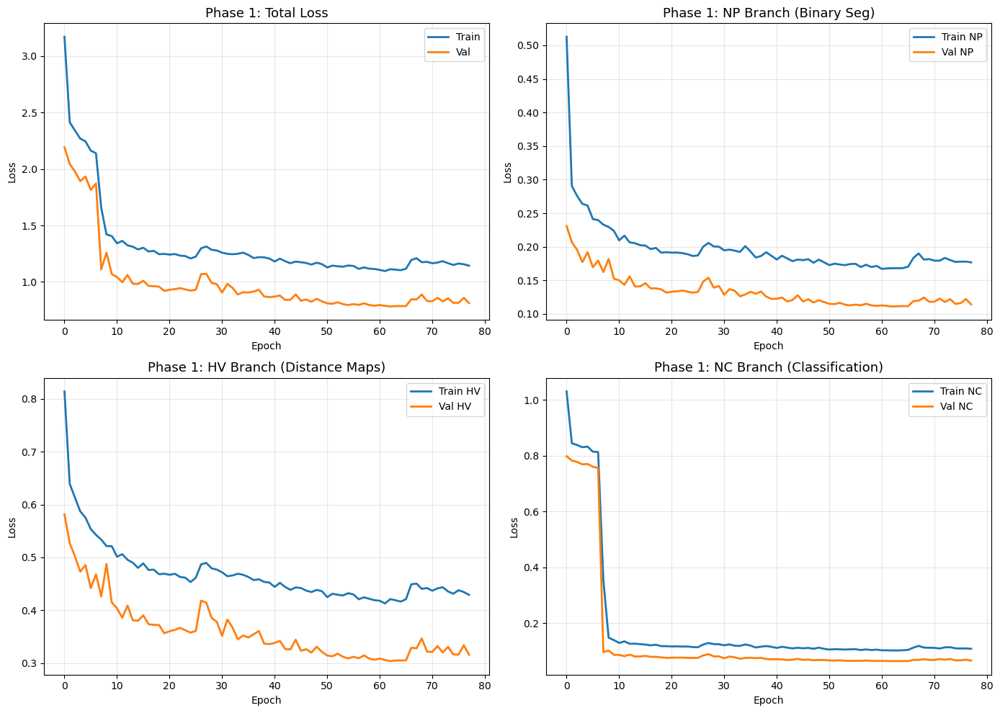

Saved to results/training_curves_phase2.png


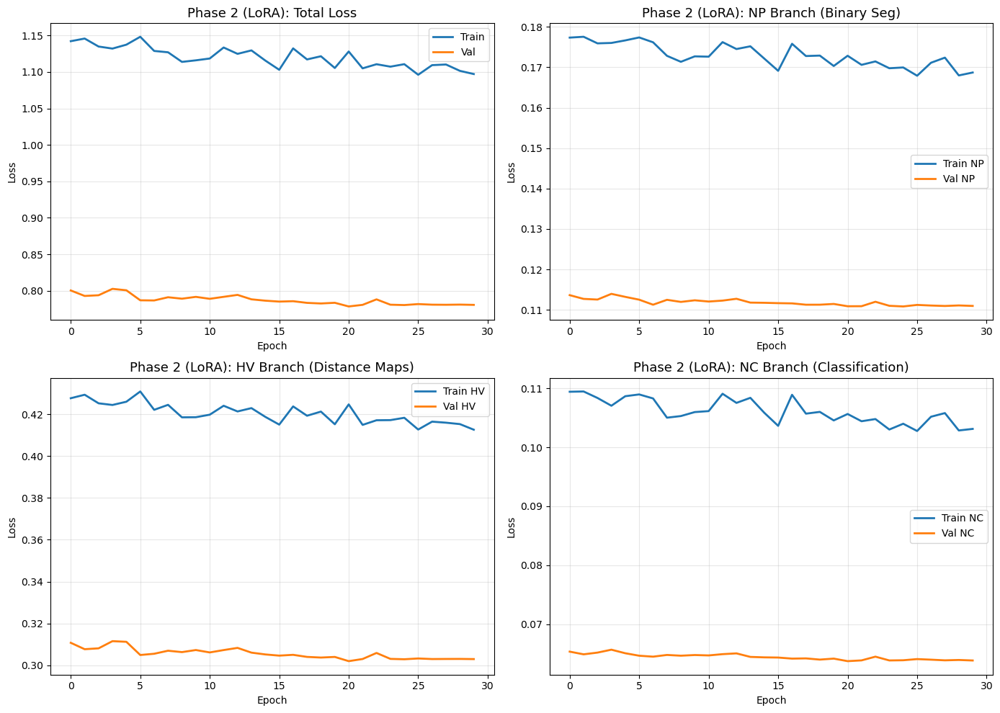

Training curves plotted and saved.


In [30]:
# ============================================================
# 10a. Training Curves
# ============================================================

def flatten_history(h):
    """Convert nested history dict to flat keys for plotting.
    
    Training loops save:  h['train']['total'], h['train']['np_loss'], ...
    Plotting expects:     h['train_loss'],     h['train_np'], ...
    """
    flat = {}
    for split in ['train', 'val']:
        if split in h and isinstance(h[split], dict):
            for k, v in h[split].items():
                if k == 'total':
                    flat[f'{split}_loss'] = v
                else:
                    # np_loss -> train_np, hv_loss -> train_hv, nc_loss -> train_nc
                    short_key = k.replace('_loss', '')
                    flat[f'{split}_{short_key}'] = v
    if 'lr' in h:
        flat['lr'] = h['lr']
    return flat


def plot_training_curves(history, title_prefix='', save_path=None):
    """Plot training/validation loss curves for all branches."""
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))

    # Total loss
    ax = axes[0, 0]
    ax.plot(history['train_loss'], label='Train', linewidth=2)
    ax.plot(history['val_loss'], label='Val', linewidth=2)
    ax.set_title(f'{title_prefix}Total Loss', fontsize=13)
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Loss')
    ax.legend()
    ax.grid(True, alpha=0.3)

    # NP branch
    ax = axes[0, 1]
    if 'train_np' in history:
        ax.plot(history['train_np'], label='Train NP', linewidth=2)
    if 'val_np' in history:
        ax.plot(history['val_np'], label='Val NP', linewidth=2)
    ax.set_title(f'{title_prefix}NP Branch (Binary Seg)', fontsize=13)
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Loss')
    ax.legend()
    ax.grid(True, alpha=0.3)

    # HV branch
    ax = axes[1, 0]
    if 'train_hv' in history:
        ax.plot(history['train_hv'], label='Train HV', linewidth=2)
    if 'val_hv' in history:
        ax.plot(history['val_hv'], label='Val HV', linewidth=2)
    ax.set_title(f'{title_prefix}HV Branch (Distance Maps)', fontsize=13)
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Loss')
    ax.legend()
    ax.grid(True, alpha=0.3)

    # NC branch
    ax = axes[1, 1]
    if 'train_nc' in history:
        ax.plot(history['train_nc'], label='Train NC', linewidth=2)
    if 'val_nc' in history:
        ax.plot(history['val_nc'], label='Val NC', linewidth=2)
    ax.set_title(f'{title_prefix}NC Branch (Classification)', fontsize=13)
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Loss')
    ax.legend()
    ax.grid(True, alpha=0.3)

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
        print(f'Saved to {save_path}')
    plt.show()


# Load history from saved .pth files (works even if training was in a previous session)
phase1_hist_path = f'{RESULTS_DIR}/history_phase1.pth'
phase2_hist_path = f'{RESULTS_DIR}/history_phase2.pth'

plotted = False

if os.path.exists(phase1_hist_path):
    raw = torch.load(phase1_hist_path, map_location='cpu', weights_only=False)
    phase1_flat = flatten_history(raw)
    if 'train_loss' in phase1_flat and len(phase1_flat['train_loss']) > 0:
        plot_training_curves(
            phase1_flat,
            title_prefix='Phase 1: ',
            save_path=f'{RESULTS_DIR}/training_curves_phase1.png'
        )
        plotted = True
    else:
        print(f'Phase 1 history found but empty — skipping.')
else:
    print(f'No Phase 1 history at {phase1_hist_path} — skipping.')

if os.path.exists(phase2_hist_path):
    raw = torch.load(phase2_hist_path, map_location='cpu', weights_only=False)
    phase2_flat = flatten_history(raw)
    if 'train_loss' in phase2_flat and len(phase2_flat['train_loss']) > 0:
        plot_training_curves(
            phase2_flat,
            title_prefix='Phase 2 (LoRA): ',
            save_path=f'{RESULTS_DIR}/training_curves_phase2.png'
        )
        plotted = True
    else:
        print(f'Phase 2 history found but empty — skipping.')
else:
    print(f'No Phase 2 history at {phase2_hist_path} — skipping.')

if plotted:
    print('Training curves plotted and saved.')
else:
    print('No training history available to plot.')


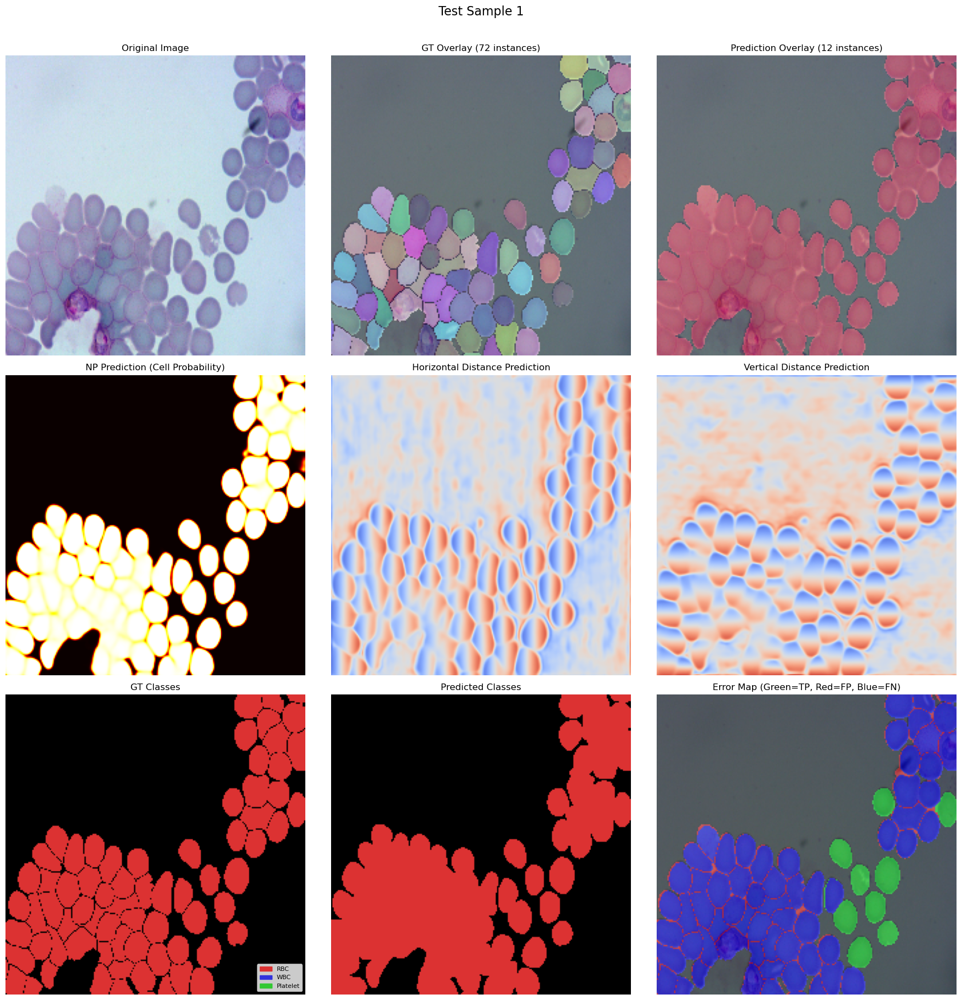

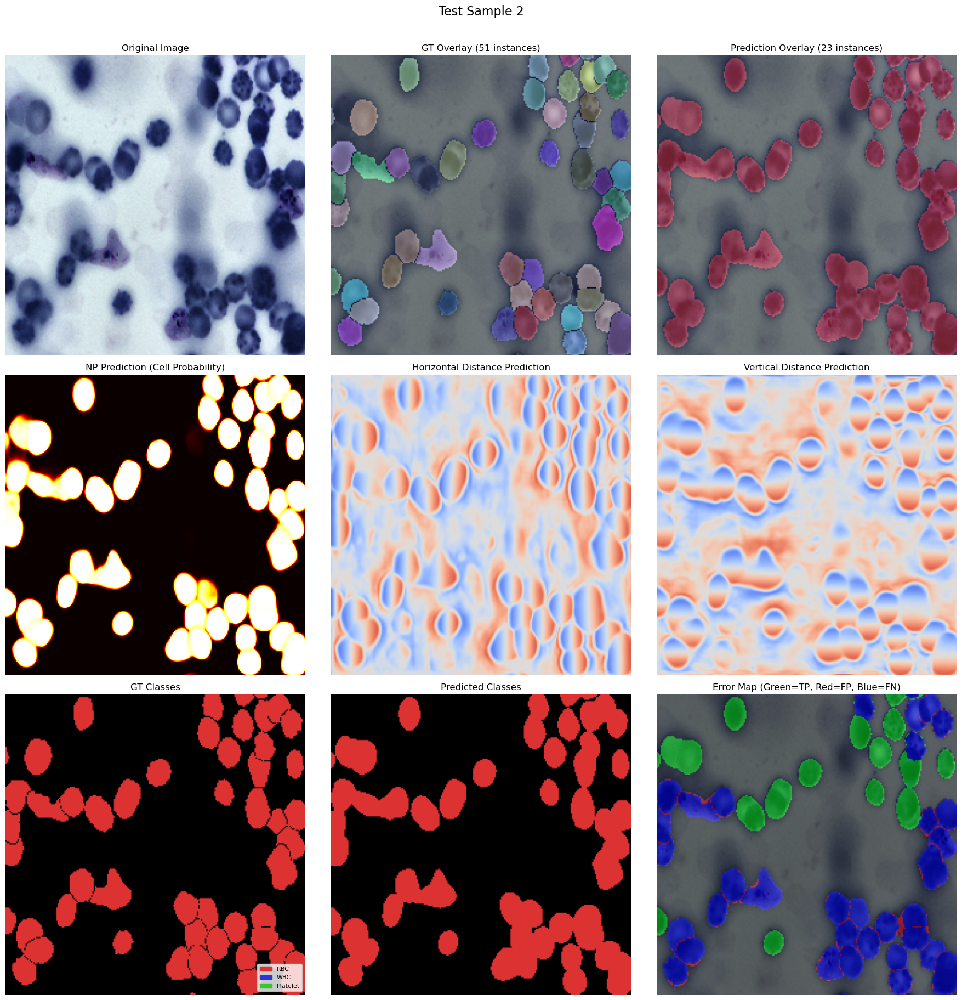

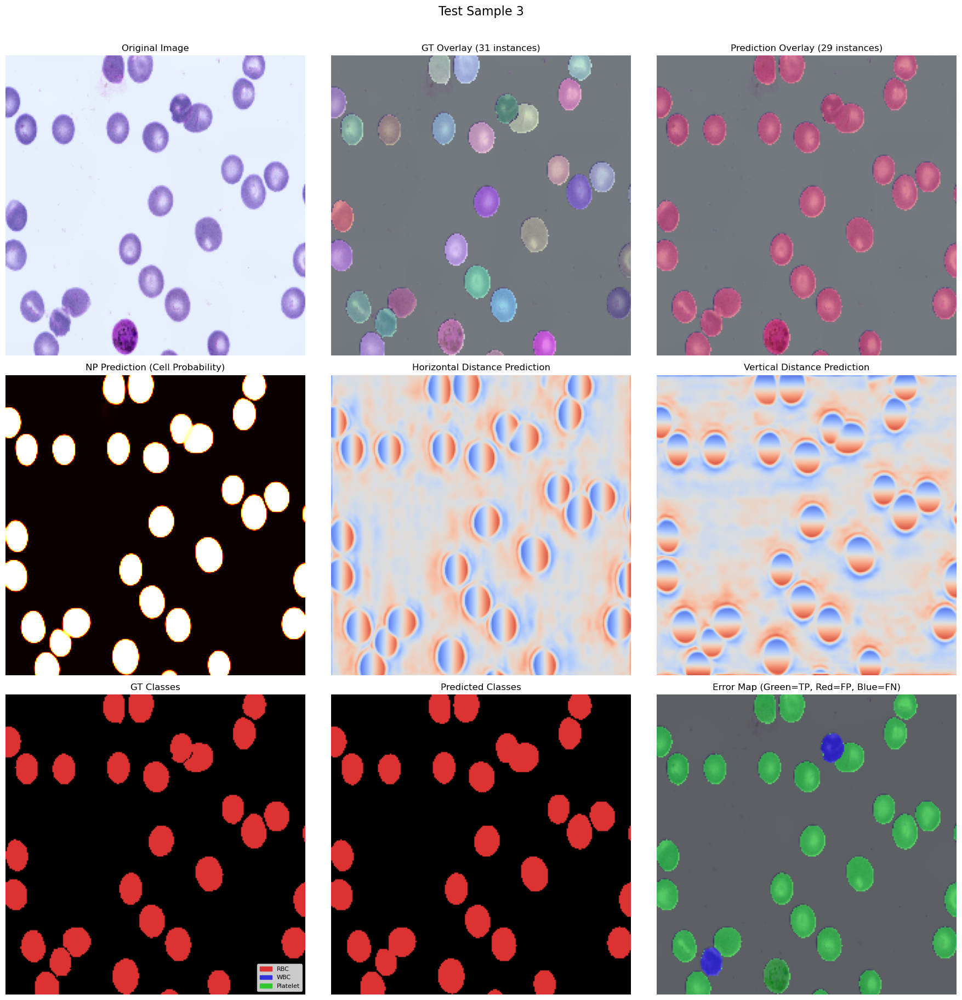

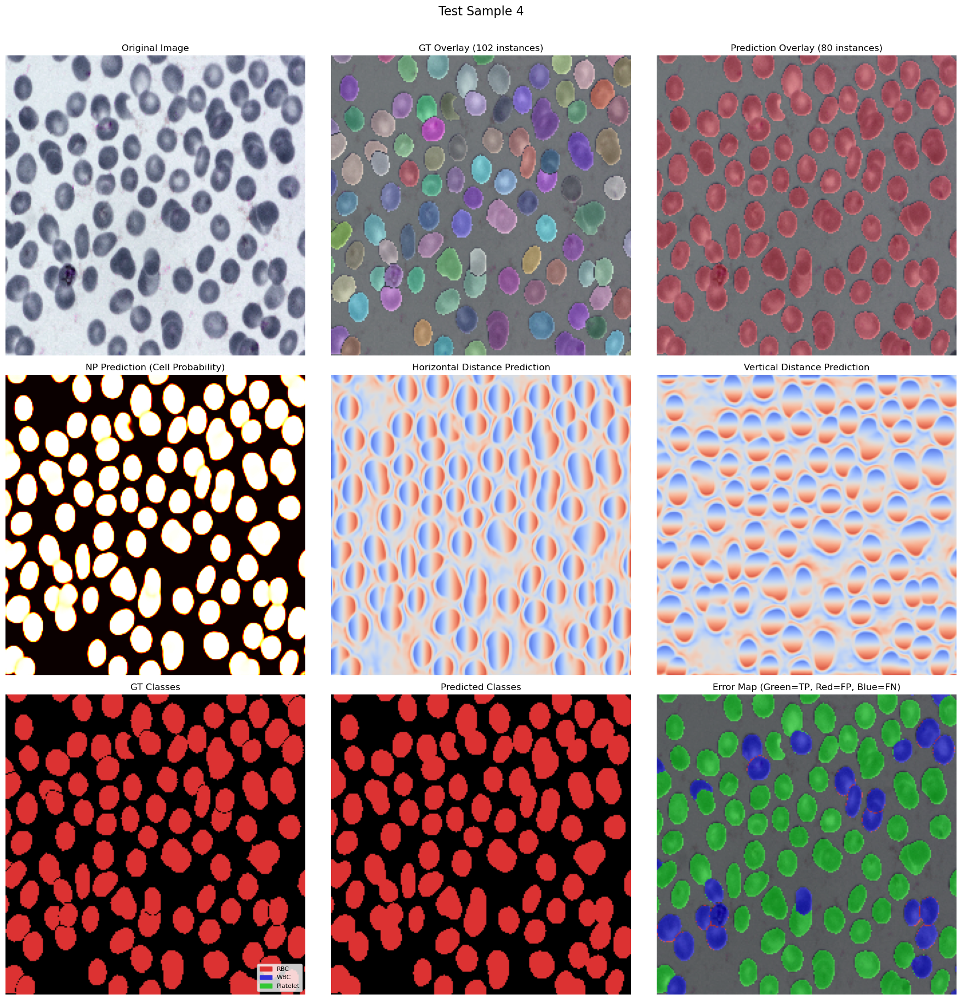

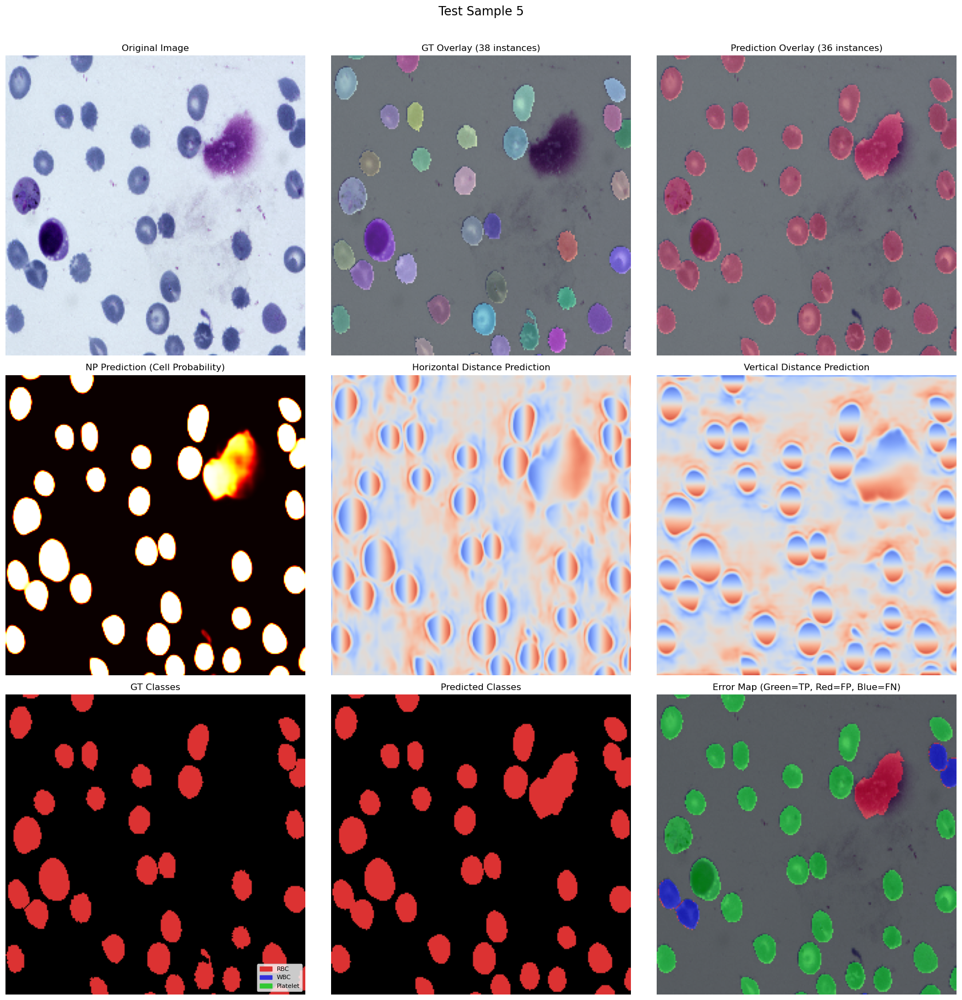


5 visualizations saved to results/


In [36]:
# ============================================================
# 10b. Qualitative Predictions (5 samples with full analysis)
# ============================================================

def colorize_instances(inst_map, class_dict=None):
    """Create an RGB visualization of instance map with class-based colors."""
    h, w = inst_map.shape
    vis = np.zeros((h, w, 3), dtype=np.uint8)
    for iid in np.unique(inst_map):
        if iid == 0:
            continue
        mask = (inst_map == iid)
        if class_dict and iid in class_dict:
            cid = class_dict[iid]
            color = CLASS_COLORS.get(cid, (128, 128, 128))
        else:
            # Random color
            rng = np.random.RandomState(int(iid))
            color = tuple(rng.randint(50, 255, 3).tolist())
        vis[mask] = color
    return vis


def create_error_map(pred_inst, gt_inst, iou_thresh=0.5):
    """
    Create TP/FP/FN error visualization.
    Green = TP (matched), Red = FP (no GT match), Blue = FN (missed GT).
    """
    h, w = pred_inst.shape
    error_map = np.zeros((h, w, 3), dtype=np.uint8)

    pred_ids = [i for i in np.unique(pred_inst) if i > 0]
    gt_ids = [i for i in np.unique(gt_inst) if i > 0]

    matched_pred = set()
    matched_gt = set()

    # Match by IoU
    for pid in pred_ids:
        p_mask = (pred_inst == pid)
        best_iou = 0
        best_gid = None
        for gid in gt_ids:
            g_mask = (gt_inst == gid)
            inter = (p_mask & g_mask).sum()
            union = (p_mask | g_mask).sum()
            iou = inter / (union + 1e-8)
            if iou > best_iou:
                best_iou = iou
                best_gid = gid
        if best_iou >= iou_thresh:
            matched_pred.add(pid)
            matched_gt.add(best_gid)

    # Color: TP=green, FP=red, FN=blue
    for pid in pred_ids:
        mask = (pred_inst == pid)
        if pid in matched_pred:
            error_map[mask] = (0, 200, 0)   # TP: green
        else:
            error_map[mask] = (200, 0, 0)   # FP: red

    for gid in gt_ids:
        if gid not in matched_gt:
            mask = (gt_inst == gid)
            error_map[mask] = (0, 0, 200)   # FN: blue

    return error_map


num_vis = min(5, len(test_preds))
for i in range(num_vis):
    pred = test_preds[i]

    # Convert image from (C, H, W) tensor to (H, W, C) numpy for matplotlib
    img_display = pred['image'].permute(1, 2, 0).cpu().numpy()
    img_display = (img_display - img_display.min()) / (img_display.max() - img_display.min() + 1e-8)

    fig, axes = plt.subplots(3, 3, figsize=(18, 18))

    # Row 1: Original, GT instances, Predicted instances
    axes[0, 0].imshow(img_display)
    axes[0, 0].set_title('Original Image')

    gt_vis = colorize_instances(pred['gt_inst'])
    axes[0, 1].imshow(img_display)
    axes[0, 1].imshow(gt_vis, alpha=0.5)
    n_gt = len([x for x in np.unique(pred['gt_inst']) if x > 0])
    axes[0, 1].set_title(f'GT Overlay ({n_gt} instances)')

    pred_vis = colorize_instances(pred['pred_inst'], pred['pred_cls'])
    axes[0, 2].imshow(img_display)
    axes[0, 2].imshow(pred_vis, alpha=0.5)
    n_pred = len([x for x in np.unique(pred['pred_inst']) if x > 0])
    axes[0, 2].set_title(f'Prediction Overlay ({n_pred} instances)')

    # Row 2: NP heatmap, H-distance, V-distance
    axes[1, 0].imshow(pred['np_pred'], cmap='hot', vmin=0, vmax=1)
    axes[1, 0].set_title('NP Prediction (Cell Probability)')

    axes[1, 1].imshow(pred['hv_pred'][:, :, 0], cmap='coolwarm', vmin=-1, vmax=1)
    axes[1, 1].set_title('Horizontal Distance Prediction')

    axes[1, 2].imshow(pred['hv_pred'][:, :, 1], cmap='coolwarm', vmin=-1, vmax=1)
    axes[1, 2].set_title('Vertical Distance Prediction')

    # Row 3: GT class map, Pred class map, Error map
    # Reconstruct GT class map from instance map + class dict
    gt_cls_vis = np.zeros((*pred['gt_inst'].shape, 3), dtype=np.uint8)
    for iid, cid in pred['gt_cls'].items():
        gt_cls_vis[pred['gt_inst'] == iid] = CLASS_COLORS.get(cid, (128, 128, 128))

    axes[2, 0].imshow(gt_cls_vis)
    axes[2, 0].set_title('GT Classes')

    pred_cls_vis = np.zeros((*pred['pred_inst'].shape, 3), dtype=np.uint8)
    for iid, cid in pred['pred_cls'].items():
        pred_cls_vis[pred['pred_inst'] == iid] = CLASS_COLORS.get(cid, (128, 128, 128))
    axes[2, 1].imshow(pred_cls_vis)
    axes[2, 1].set_title('Predicted Classes')

    error_vis = create_error_map(pred['pred_inst'], pred['gt_inst'])
    axes[2, 2].imshow(img_display)
    axes[2, 2].imshow(error_vis, alpha=0.6)
    axes[2, 2].set_title('Error Map (Green=TP, Red=FP, Blue=FN)')

    # Add legend
    patches = [
        mpatches.Patch(color=np.array(CLASS_COLORS[c])/255, label=CLASS_NAMES[c])
        for c in range(1, NUM_CLASSES)
    ]
    axes[2, 0].legend(handles=patches, loc='lower right', fontsize=8)

    for ax_row in axes:
        for ax in ax_row:
            ax.axis('off')

    plt.suptitle(f'Test Sample {i+1}', fontsize=16, y=1.01)
    plt.tight_layout()
    plt.savefig(f'{RESULTS_DIR}/visualization_sample_{i+1}.png', dpi=150, bbox_inches='tight')
    plt.show()

print(f"\n{num_vis} visualizations saved to {RESULTS_DIR}/")

In [38]:
# ============================================================
# 10c. Metrics Summary Table
# ============================================================
if os.path.exists(f'{RESULTS_DIR}/metrics.json'):
    with open(f'{RESULTS_DIR}/metrics.json') as f:
        m = json.load(f)

    print("=" * 60)
    print("RESULTS SUMMARY TABLE")
    print("=" * 60)

    # Pixel-level table
    header = f"{'Metric':<20} {'RBC':>8} {'WBC':>8} {'Platelet':>8} {'Mean':>8}"
    print(f"\n{header}")
    print("-" * len(header))
    iou_vals = m['pixel_iou']
    dice_vals = m['pixel_dice']
    print(f"{'IoU':<20} {iou_vals.get('RBC',0):>8.4f} {iou_vals.get('WBC',0):>8.4f} "
          f"{iou_vals.get('Platelet',0):>8.4f} {m['mean_iou']:>8.4f}")
    print(f"{'Dice':<20} {dice_vals.get('RBC',0):>8.4f} {dice_vals.get('WBC',0):>8.4f} "
          f"{dice_vals.get('Platelet',0):>8.4f} {m['mean_dice']:>8.4f}")

    print(f"\n{'Detection @ IoU=0.5':<30}")
    det = m['detection']
    print(f"  Precision:  {det['precision']:.4f}")
    print(f"  Recall:     {det['recall']:.4f}")
    print(f"  F1:         {det['f1']:.4f}")

    print(f"\n{'Instance Segmentation':<30}")
    print(f"  mAP@0.50:       {m['mAP_50']:.4f}")
    print(f"  mAP@[.50:.95]:  {m['mAP_50_95']:.4f}")

    print(f"\n{'Panoptic Quality':<30}")
    pq = m['panoptic']
    print(f"  PQ: {pq['PQ']:.4f}  (SQ={pq['SQ']:.4f}, RQ={pq['RQ']:.4f})")
    print("=" * 60)
else:
    print("No metrics file found. Run evaluation first.")

RESULTS SUMMARY TABLE

Metric                    RBC      WBC Platelet     Mean
--------------------------------------------------------
IoU                    0.9207   0.0000   0.0000   0.3069
Dice                   0.9587   0.0000   0.0000   0.3196

Detection @ IoU=0.5           
  Precision:  0.8823
  Recall:     0.5809
  F1:         0.7005

Instance Segmentation         
  mAP@0.50:       0.4819
  mAP@[.50:.95]:  0.3865

Panoptic Quality              
  PQ: 0.7356  (SQ=0.8928, RQ=0.8239)
